## Table of Content
**[1. Import Libraries](#1.-Import-Libraries)**

**[2. Read Data](#2.-Read-Data)**

**[3. Mathematicatical Computation](#3.-Mathematical-Computation)**
   - [3.1 Fill Batsman Points](#3.1-Fill-Batsman-Points)
   - [3.2 Fill Bowler Points](#3.2-Fill-Bowler-Points)
   - [3.3 Performance Measure](#3.3-Performance-Measure)
   - [3.4 Get Overall Data](#3.4-Get-Overall-Data)
   - [3.5 Players Performance by match](#3.5-Players-Performance-by-match)
   - [3.6 Player Average Performance](#3.6-Player-Average-Performance)
   - [3.7 Player Rolling Average Performance](#3.7-Player-Rolling-Average-Performance)
   - [3.8 Prepare ML Dataset for Batsman](#3.8-Prepare-ML-Dataset-for-Batsman)

**[4. Prepare and Analyse the Data](#4.-Prepare-and-Analyse-the-Data)**
   - [4.1 Understand Data](#4.1-Understand-Data)   
        - [4.1.1 Data Type](#4.1.1-Data-Type)
        - [4.1.2 Feature Engineering](#4.1.2-Feature-Engineering)
        - [4.1.3 Summary Statistics](#4.1.3-Summary-Statistics)
   - [4.2 Data Conversion](#4.2-Data-Conversion)
   - [4.3 Handling Missing Values](#4.3-Handling-Missing-Values)
   - [4.4 Handling Outliers](#4.4-Handling-Outliers)
   - [4.5 Study Correlation](#4.5-Study-Correlation)
   - [4.6 Feature Scaling](#4.6-Feature-Scaling)
        - [4.6.1 One Hot Encoding](#4.6.1-One-Hot-Encoding)
        - [4.6.2 Normalization](#4.6.2-Normalization)

**[5. Random Forest](#5.-Random-Forest)**
   - [5.1 Random Forest Model](#5.1-Random-Forest-Model)
   - [5.2 Random Forest with GridSearchCV](#5.2-Random-Forest-with-GridSearchCV)
   
**[6. Conclusion and Interpretation](#6.-Conclusion-and-Interpretation)**


In [1]:
! pip install --upgrade category_encoders

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.9/81.9 kB 2.2 MB/s eta 0:00:00


## 1. Import Libraries

In [ ]:
# suppress warnings
from warnings import filterwarnings
filterwarnings('ignore')

# 'Os' module provides functions for interacting with the operating system
import os

# 'Pandas' is used for data manipulation and analysis
import pandas as pd

# 'Numpy' is used for mathematical operations on large, multi-dimensional arrays and matrices
import numpy as np

# 'Matplotlib' is a data visualization library for 2D and 3D plots, built on numpy
import matplotlib.pyplot as plt
%matplotlib inline

# 'Seaborn' is based on matplotlib; used for plotting statistical graphics
import seaborn as sns

# 'Scikit-learn' (sklearn) emphasizes various regression, classification and clustering algorithms
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn import metrics
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor

# import 'is_string_dtype' and 'is_numeric_dtype' to check the data type
from pandas.api.types import is_string_dtype
from pandas.api.types import is_numeric_dtype

# 'Statsmodels' is used to build and analyze various statistical models
import statsmodels
import statsmodels.api as sm


# 'SciPy' is used to perform scientific computations
from scipy.stats import jarque_bera
from scipy import stats

from sklearn.preprocessing import StandardScaler
from category_encoders import OneHotEncoder

from sklearn.preprocessing import MinMaxScaler
from xgboost import XGBRegressor

In [ ]:
# set the plot size using 'rcParams'
# once the plot size is set using 'rcParams', it sets the size of all the forthcoming plots in the file
# pass width and height in inches to 'figure.figsize'
plt.rcParams['figure.figsize'] = [15,8]

# display all columns of the dataframe
pd.options.display.max_columns = None

# display all rows of the dataframe
pd.options.display.max_rows = None

# use below code to convert the 'exponential' values to float
np.set_printoptions(suppress=True)

In [ ]:
ML_Data_Bowl=pd.read_excel("C:\Users\pvikramq\Documents\Course\Project\ML DATA SET\ML_Data_Bowl.xlsx")

In [ ]:
df=ML_Data_Bowl.copy()

## 4. Prepare and Analyse the Data

Data preparation is the process of cleaning and transforming raw data before building predictive models.

Here we will analyze and prepare data to perform regression techniques:
1. Check dimensions of the dataframe in terms of rows and columns
2. Check the data types. If not as per business context, change the data types
3. Study Summary Statistics
4. Distribution of Variables
5. Analyze relationship between numeric variables
6. Check for missing values
7. Study correlation
8. Analyze relationship between numeric and categoric variables

Note: It is an art to explore data and one will need more and more practice to gain expertise in this area.

## 4.1 Understand Data

**Let us now see the number of variables and observations in the data.**

In [ ]:
df.shape

(11223, 32)

### 4.1.1 Data Type

In [ ]:
df.dtypes

ID                    int64
innings               int64
bowler               object
BattingTeam          object
Performance Bowl    float64
Venue                object
Position1             int64
Position2             int64
Position3             int64
Position4             int64
Position5             int64
Position6             int64
Position7             int64
Position8             int64
Position9             int64
Position10            int64
Position11            int64
Opp_Team             object
Bowl_Start          float64
Batter1             float64
Batter2             float64
Batter3             float64
Batter4             float64
Batter5             float64
Batter6             float64
Batter7             float64
Batter8             float64
Batter9             float64
Batter10            float64
Batter11            float64
Type                 object
Bowling Style        object
dtype: object

In [ ]:
df.select_dtypes(include=["object"]).columns

Index(['bowler', 'BattingTeam', 'Venue', 'Opp_Team', 'Type', 'Bowling Style'], dtype='object')

In [ ]:
int_col=['Position1', 'Position2', 'Position3',
       'Position4', 'Position5', 'Position6', 'Position7', 'Position8',
       'Position9', 'Position10', 'Position11']

In [ ]:
for col in int_col:
    df[col]=df[col].astype(int)

In [ ]:
df.select_dtypes(include=["object"]).columns

Index(['bowler', 'BattingTeam', 'Venue', 'Opp_Team', 'Type', 'Bowling Style'], dtype='object')

In [ ]:
float_col=['Bowl_Start', 'Batter1',
       'Batter2', 'Batter3', 'Batter4', 'Batter5', 'Batter6', 'Batter7',
       'Batter8', 'Batter9', 'Batter10', 'Batter11']

In [ ]:
df=df.replace('',np.nan, regex=True)

In [ ]:
for col in float_col:
    df[col]=df[col].astype(float)

In [ ]:
df.dtypes

ID                    int64
innings               int64
bowler               object
BattingTeam          object
Performance Bowl    float64
Venue                object
Position1             int32
Position2             int32
Position3             int32
Position4             int32
Position5             int32
Position6             int32
Position7             int32
Position8             int32
Position9             int32
Position10            int32
Position11            int32
Opp_Team             object
Bowl_Start          float64
Batter1             float64
Batter2             float64
Batter3             float64
Batter4             float64
Batter5             float64
Batter6             float64
Batter7             float64
Batter8             float64
Batter9             float64
Batter10            float64
Batter11            float64
Type                 object
Bowling Style        object
dtype: object

### 4.1.2 Feature Engineering

For feature engineering, we Drop the redundant variables

In [ ]:
df=df.drop(["bowler","ID"],axis=1)

In [ ]:
df.head()

,innings,BattingTeam,Performance Bowl,Venue,Position1,Position2,Position3,Position4,Position5,Position6,Position7,Position8,Position9,Position10,Position11,Opp_Team,Bowl_Start,Batter1,Batter2,Batter3,Batter4,Batter5,Batter6,Batter7,Batter8,Batter9,Batter10,Batter11,Type,Bowling Style
0,1,Rajasthan Royals,115.214286,"Narendra Modi Stadium, Ahmedabad",0,0,0,0,0,0,0,0,0,0,1,Gujarat Titans,110.510876,105.176514,135.15678,110.161804,105.806968,102.345436,110.112605,105.049592,106.21597,106.291902,NaN,NaN,Bowler,Right Handed
1,1,Rajasthan Royals,117.054545,"Narendra Modi Stadium, Ahmedabad",0,0,0,0,0,0,0,0,0,1,0,Gujarat Titans,111.707792,105.176514,135.15678,110.161804,105.806968,102.345436,110.112605,105.049592,106.21597,106.291902,NaN,NaN,Bowler,Left Handed
2,1,Rajasthan Royals,105.201299,"Narendra Modi Stadium, Ahmedabad",0,0,0,0,0,0,0,0,1,0,0,Gujarat Titans,109.647523,105.176514,135.15678,110.161804,105.806968,102.345436,110.112605,105.049592,106.21597,106.291902,NaN,NaN,Bowler,Right Handed
3,1,Rajasthan Royals,118.300000,"Narendra Modi Stadium, Ahmedabad",0,0,0,0,0,0,1,0,0,0,0,Gujarat Titans,119.865873,105.176514,135.15678,110.161804,105.806968,102.345436,110.112605,105.049592,106.21597,106.291902,NaN,NaN,Bowler,Right Handed
4,1,Rajasthan Royals,154.000000,"Narendra Modi Stadium, Ahmedabad",0,0,0,1,0,0,0,0,0,0,0,Gujarat Titans,127.045503,105.176514,135.15678,110.161804,105.806968,102.345436,110.112605,105.049592,106.21597,106.291902,NaN,NaN,All-Rounder,Right Handed


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11223 entries, 0 to 11222
Data columns (total 30 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   innings           11223 non-null  int64  
 1   BattingTeam       11223 non-null  object 
 2   Performance Bowl  11223 non-null  float64
 3   Venue             11223 non-null  object 
 4   Position1         11223 non-null  int32  
 5   Position2         11223 non-null  int32  
 6   Position3         11223 non-null  int32  
 7   Position4         11223 non-null  int32  
 8   Position5         11223 non-null  int32  
 9   Position6         11223 non-null  int32  
 10  Position7         11223 non-null  int32  
 11  Position8         11223 non-null  int32  
 12  Position9         11223 non-null  int32  
 13  Position10        11223 non-null  int32  
 14  Position11        11223 non-null  int32  
 15  Opp_Team          11223 non-null  object 
 16  Bowl_Start        11223 non-null  float6

### 4.1.3 Summary Statistics

Here we take a look at the summary of each attribute. This includes the count, mean, the minimum and maximum values as well as some percentiles for numeric variables and count, unique, top, frequency for other variable types.

In our dataset we have both numerical and categorical variables. Now we check for summary statistics of all the variables

1. For numerical variables, use the describe()
2. For categorical variables use the describe(include='object')

In [ ]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
innings,11223.0,1.496302,0.500009,1.000000,1.000000,1.000000,2.000000,2.000000
Performance Bowl,11223.0,116.397081,14.640874,92.623810,103.872405,114.984848,124.591955,206.800000
Position1,11223.0,0.016662,0.128008,0.000000,0.000000,0.000000,0.000000,1.000000
Position2,11223.0,0.017286,0.130340,0.000000,0.000000,0.000000,0.000000,1.000000
Position3,11223.0,0.033235,0.179258,0.000000,0.000000,0.000000,0.000000,1.000000
Position4,11223.0,0.040987,0.198270,0.000000,0.000000,0.000000,0.000000,1.000000
Position5,11223.0,0.060055,0.237600,0.000000,0.000000,0.000000,0.000000,1.000000
Position6,11223.0,0.070480,0.255966,0.000000,0.000000,0.000000,0.000000,1.000000
Position7,11223.0,0.108438,0.310947,0.000000,0.000000,0.000000,0.000000,1.000000
Position8,11223.0,0.152722,0.359735,0.000000,0.000000,0.000000,0.000000,1.000000


In [ ]:
df.describe(include='object').transpose()

,count,unique,top,freq
BattingTeam,11223,18,Mumbai Indians,1349
Venue,11223,49,Eden Gardens,922
Opp_Team,11223,18,Mumbai Indians,1381
Type,11223,4,Bowler,6901
Bowling Style,11223,2,Right Handed,8343


## 4.2 Data Conversion

Here we convert the data as required

In [ ]:
df.innings.unique()

array([1, 2], dtype=int64)

In [ ]:
df["innings"]=df["innings"].replace(to_replace=[1,2], value=[0,1])

In [ ]:
df.rename(columns={"Bowling Style": "Bowl_Style", "Bowl_Start":"Bowl Start","BattingTeam":"Team"}, inplace=True)

In [ ]:
df.head()

,innings,Team,Performance Bowl,Venue,Position1,Position2,Position3,Position4,Position5,Position6,Position7,Position8,Position9,Position10,Position11,Opp_Team,Bowl Start,Batter1,Batter2,Batter3,Batter4,Batter5,Batter6,Batter7,Batter8,Batter9,Batter10,Batter11,Type,Bowl_Style
0,0,Rajasthan Royals,115.214286,"Narendra Modi Stadium, Ahmedabad",0,0,0,0,0,0,0,0,0,0,1,Gujarat Titans,110.510876,105.176514,135.15678,110.161804,105.806968,102.345436,110.112605,105.049592,106.21597,106.291902,NaN,NaN,Bowler,Right Handed
1,0,Rajasthan Royals,117.054545,"Narendra Modi Stadium, Ahmedabad",0,0,0,0,0,0,0,0,0,1,0,Gujarat Titans,111.707792,105.176514,135.15678,110.161804,105.806968,102.345436,110.112605,105.049592,106.21597,106.291902,NaN,NaN,Bowler,Left Handed
2,0,Rajasthan Royals,105.201299,"Narendra Modi Stadium, Ahmedabad",0,0,0,0,0,0,0,0,1,0,0,Gujarat Titans,109.647523,105.176514,135.15678,110.161804,105.806968,102.345436,110.112605,105.049592,106.21597,106.291902,NaN,NaN,Bowler,Right Handed
3,0,Rajasthan Royals,118.300000,"Narendra Modi Stadium, Ahmedabad",0,0,0,0,0,0,1,0,0,0,0,Gujarat Titans,119.865873,105.176514,135.15678,110.161804,105.806968,102.345436,110.112605,105.049592,106.21597,106.291902,NaN,NaN,Bowler,Right Handed
4,0,Rajasthan Royals,154.000000,"Narendra Modi Stadium, Ahmedabad",0,0,0,1,0,0,0,0,0,0,0,Gujarat Titans,127.045503,105.176514,135.15678,110.161804,105.806968,102.345436,110.112605,105.049592,106.21597,106.291902,NaN,NaN,All-Rounder,Right Handed


In [ ]:
df.Team.unique()

array(['Rajasthan Royals', 'Gujarat Titans',
       'Royal Challengers Bangalore', 'Lucknow Super Giants',
       'Sunrisers Hyderabad', 'Punjab Kings', 'Delhi Capitals',
       'Mumbai Indians', 'Chennai Super Kings', 'Kolkata Knight Riders',
       'Kings XI Punjab', 'Delhi Daredevils', 'Rising Pune Supergiant',
       'Gujarat Lions', 'Rising Pune Supergiants', 'Pune Warriors',
       'Deccan Chargers', 'Kochi Tuskers Kerala'], dtype=object)

In [ ]:
df=df.replace(to_replace=['Kolkata Knight Riders', 'Royal Challengers Bangalore',
       'Chennai Super Kings', 'Kings XI Punjab', 'Rajasthan Royals',
       'Delhi Daredevils', 'Mumbai Indians', 'Deccan Chargers',
       'Kochi Tuskers Kerala', 'Pune Warriors', 'Sunrisers Hyderabad',
       'Rising Pune Supergiants', 'Gujarat Lions',
       'Rising Pune Supergiant', 'Delhi Capitals', 'Punjab Kings',
       'Lucknow Super Giants', 'Gujarat Titans'],
             value=["Kolkata","Bangalore","Chennai","Punjab","Rajasthan","Delhi","Mumbai","Hyderabad","Kerala","Maharashtra",
                    "Hyderabad","Maharashtra","Gujarat","Maharashtra","Delhi","Punjab","Lucknow","Gujarat"])

In [ ]:
df.Team.unique()

array(['Rajasthan', 'Gujarat', 'Bangalore', 'Lucknow', 'Hyderabad',
       'Punjab', 'Delhi', 'Mumbai', 'Chennai', 'Kolkata', 'Maharashtra',
       'Kerala'], dtype=object)

In [ ]:
df.Type.unique()

array(['Bowler ', 'All-Rounder ', 'Batsman ', 'Wicket-Keeper '],
      dtype=object)

In [ ]:
df=df.replace('Wicket-Keeper ','Wicket-keeper ')

In [ ]:
df.Type.unique()

array(['Bowler ', 'All-Rounder ', 'Batsman ', 'Wicket-keeper '],
      dtype=object)

In [ ]:
df=df.replace(to_replace=['All-Rounder ', 'Batsman ', 'Bowler ', 'Wicket-keeper '],
             value=["AR","Bat","Bowl","Bat"])

In [ ]:
df.Type.unique()

array(['Bowl', 'AR', 'Bat'], dtype=object)

In [ ]:
df.Bowl_Style.unique()

array(['Right Handed', 'Left Handed'], dtype=object)

In [ ]:
df=df.replace(to_replace=['Right Handed', 'Left Handed'],
             value=["RH","LH"])

In [ ]:
df.Bowl_Style.unique()

array(['RH', 'LH'], dtype=object)

In [ ]:
df.Venue.unique()

array(['Narendra Modi Stadium, Ahmedabad', 'Eden Gardens, Kolkata',
       'Wankhede Stadium, Mumbai', 'Brabourne Stadium, Mumbai',
       'Dr DY Patil Sports Academy, Mumbai',
       'Maharashtra Cricket Association Stadium, Pune',
       'Dubai International Cricket Stadium', 'Sharjah Cricket Stadium',
       'Zayed Cricket Stadium, Abu Dhabi', 'Arun Jaitley Stadium, Delhi',
       'MA Chidambaram Stadium, Chepauk, Chennai', 'Sheikh Zayed Stadium',
       'Rajiv Gandhi International Stadium',
       'Dr. Y.S. Rajasekhara Reddy ACA-VDCA Cricket Stadium',
       'MA Chidambaram Stadium', 'Wankhede Stadium',
       'Punjab Cricket Association IS Bindra Stadium',
       'M.Chinnaswamy Stadium', 'Arun Jaitley Stadium', 'Eden Gardens',
       'Sawai Mansingh Stadium',
       'Maharashtra Cricket Association Stadium',
       'Holkar Cricket Stadium',
       'Rajiv Gandhi International Stadium, Uppal',
       'M Chinnaswamy Stadium', 'Feroz Shah Kotla', 'Green Park',
       'Punjab Cricket A

In [ ]:
df.Venue.nunique()

49

In [ ]:
df=df.replace(to_replace=['M Chinnaswamy Stadium','Punjab Cricket Association Stadium, Mohali', 'Feroz Shah Kotla',
       'Wankhede Stadium', 'Eden Gardens', 'Sawai Mansingh Stadium','Rajiv Gandhi International Stadium, Uppal',
       'MA Chidambaram Stadium, Chepauk', 'Dr DY Patil Sports Academy','Newlands', "St George's Park", 'Kingsmead',
       'SuperSport Park','Buffalo Park', 'New Wanderers Stadium', 'De Beers Diamond Oval',
       'OUTsurance Oval', 'Brabourne Stadium','Sardar Patel Stadium, Motera', 'Barabati Stadium',
       'Brabourne Stadium, Mumbai','Vidarbha Cricket Association Stadium, Jamtha',
       'Himachal Pradesh Cricket Association Stadium', 'Nehru Stadium','Holkar Cricket Stadium',
       'Dr. Y.S. Rajasekhara Reddy ACA-VDCA Cricket Stadium','Subrata Roy Sahara Stadium',
       'Maharashtra Cricket Association Stadium','Shaheed Veer Narayan Singh International Stadium',
       'JSCA International Stadium Complex', 'Sheikh Zayed Stadium',
       'Sharjah Cricket Stadium', 'Dubai International Cricket Stadium','Punjab Cricket Association IS Bindra Stadium, Mohali',
       'Saurashtra Cricket Association Stadium', 'Green Park','M.Chinnaswamy Stadium',
       'Punjab Cricket Association IS Bindra Stadium','Rajiv Gandhi International Stadium', 'MA Chidambaram Stadium',
       'Arun Jaitley Stadium', 'MA Chidambaram Stadium, Chepauk, Chennai','Wankhede Stadium, Mumbai', 'Narendra Modi Stadium, Ahmedabad',
       'Arun Jaitley Stadium, Delhi', 'Zayed Cricket Stadium, Abu Dhabi','Dr DY Patil Sports Academy, Mumbai',
       'Maharashtra Cricket Association Stadium, Pune','Eden Gardens, Kolkata'],
        value=['Chinnaswamy','Punjab', 'Feroz',
       'Wankhede', 'Eden', 'Sawai','Rajiv',
       'Chidambaram', 'DY Patil','Newlands', "St George", 'Kingsmead',
       'SuperSpor','Buffalo', 'New Wanderers', 'De Beers',
       'OUTsurance', 'Brabourne','Sardar', 'Barabati',
       'Brabourne','Vidarbha',
       'Himachal', 'Nehru','Holkar',
       'Rajasekhara','Subrata',
       'Maharashtra','Shaheed',
       'JSCA', 'Sheikh',
       'Sharjah', 'Dubai','Punjab',
       'Saurashtra', 'Green Park','Chinnaswamy',
       'Punjab','Rajiv', 'Chidambaram',
       'Arun', 'Chidambaram','Wankhede', 'Narendra',
       'Arun', 'Zayed','DY Patil',
       'Maharashtra','Eden'])

In [ ]:
df.Venue.nunique()

37

In [ ]:
df.Venue.unique()

array(['Narendra', 'Eden', 'Wankhede', 'Brabourne', 'DY Patil',
       'Maharashtra', 'Dubai', 'Sharjah', 'Zayed', 'Arun', 'Chidambaram',
       'Sheikh', 'Rajiv', 'Rajasekhara', 'Punjab', 'Chinnaswamy', 'Sawai',
       'Holkar', 'Feroz', 'Green Park', 'Saurashtra', 'Shaheed', 'JSCA',
       'Sardar', 'Barabati', 'Subrata', 'Himachal', 'Nehru', 'Vidarbha',
       'New Wanderers', 'SuperSpor', 'Kingsmead', 'OUTsurance',
       'St George', 'De Beers', 'Buffalo', 'Newlands'], dtype=object)

In [ ]:
df.shape

(11223, 30)

## 4.3 Handling Missing Values

In [ ]:
# sort the variables on the basis of total null values in the variable
# 'isnull().sum()' returns the number of missing values in each variable
# 'ascending = False' sorts values in the descending order
# the variable with highest number of missing values will appear first
Total = df.isnull().sum().sort_values(ascending = False)

# calculate the percentage of missing values
# 'ascending = False' sorts values in the descending order
# the variable with highest percentage of missing values will appear first
Percent = (df.isnull().sum()*100/df.isnull().count()).sort_values(ascending = False)

# concat the 'Total' and 'Percent' columns using 'concat' function
# 'keys' is the list of column names
# 'axis = 1' concats along the columns
missing_data = pd.concat([Total, Percent], axis = 1, keys = ['Total', 'Percentage of Missing Values'])

# add the column containing data type of each variable
missing_data['Type'] = df[missing_data.index].dtypes
missing_data

,Total,Percentage of Missing Values,Type
Batter11,9827,87.561258,float64
Batter10,8605,76.672904,float64
Batter9,7242,64.528201,float64
Batter8,5586,49.772788,float64
Batter7,3943,35.133209,float64
Batter6,2225,19.825359,float64
Batter5,1020,9.088479,float64
Batter4,423,3.769046,float64
Batter3,105,0.935579,float64
innings,0,0.000000,int64


we can fill the missing values with the corrrepoding team mean in the respestive features

In [ ]:
df["Team"].unique()

array(['Rajasthan', 'Gujarat', 'Bangalore', 'Lucknow', 'Hyderabad',
       'Punjab', 'Delhi', 'Mumbai', 'Chennai', 'Kolkata', 'Maharashtra',
       'Kerala'], dtype=object)

In [ ]:
groupby=df.groupby("Team").mean()[["Batter3","Batter4","Batter5","Batter6","Batter7","Batter8","Batter9","Batter10","Batter11"]]

In [ ]:
groupby

,Batter3,Batter4,Batter5,Batter6,Batter7,Batter8,Batter9,Batter10,Batter11
Team,,,,,,,,,
Bangalore,113.165404,112.127150,109.542697,107.447743,105.862952,103.852987,102.878348,102.198363,100.739176
Chennai,112.624775,111.427042,110.173279,108.672596,107.544473,104.569985,102.562219,101.786098,101.520417
Delhi,110.793281,111.099089,109.800240,107.990543,107.027637,104.676896,102.223619,101.525591,100.248443
Gujarat,111.404206,112.174201,110.762437,108.304796,106.699518,104.143834,103.023531,101.612373,100.386861
Hyderabad,111.194562,111.903302,108.589704,106.765285,106.111027,104.352522,102.260175,100.917128,100.266024
Kerala,108.811015,107.589797,109.918257,108.296386,103.315356,104.569275,102.410741,99.224852,99.521649
Kolkata,110.026474,110.062815,110.090828,108.225809,107.773496,105.374964,102.756471,102.311762,101.194061
Lucknow,109.631251,109.038588,108.719612,107.696677,107.524670,106.109503,104.367929,103.324747,105.115819
Maharashtra,110.514194,110.121483,110.515707,107.745528,105.567515,103.077165,102.517839,100.850105,101.268935


In [ ]:
Team_name=groupby.index.values.tolist()

In [ ]:
Team_name

['Bangalore',
 'Chennai',
 'Delhi',
 'Gujarat',
 'Hyderabad',
 'Kerala',
 'Kolkata',
 'Lucknow',
 'Maharashtra',
 'Mumbai',
 'Punjab',
 'Rajasthan']

In [ ]:
csk=Team_name.index("Chennai")
dc=Team_name.index("Delhi")
gt=Team_name.index("Gujarat")
kkr=Team_name.index("Kolkata")
lsg=Team_name.index("Lucknow")
mi=Team_name.index("Mumbai")
pk=Team_name.index("Punjab")
rr=Team_name.index("Rajasthan")
rcb=Team_name.index("Bangalore")
sh=Team_name.index("Hyderabad")
kt=Team_name.index("Kerala")
mh=Team_name.index("Maharashtra")

In [ ]:

def batter3_fill(df):
    Team     = df["Team"]
    Batter   ="Batter3"
    Batter3  = df[Batter]


    if pd.isnull(Batter3):
        if Team == 'Rajasthan':
            team_no=rr

        if Team == 'Gujarat':
            team_no=gt

        if Team == 'Kolkata':
            team_no=kkr

        if Team == 'Punjab':
            team_no=pk


        if Team == 'Mumbai':
            team_no=mi

        if Team == 'Bangalore':
            team_no=rcb

        if Team == 'Delhi':
            team_no=dc

        if Team == 'Hyderabad':
            team_no=sh

        if Team == 'Chennai':
            team_no=csk

        if Team == 'Lucknow':
            team_no=lsg
        if Team == 'Kerala':
            team_no=kt
        if Team == 'Maharashtra':
            team_no=mh

        if Team == 'Rajasthan':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean

        if Team == 'Gujarat':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean

        if Team == 'Kolkata':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean

        if Team == 'Punjab':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean


        if Team == 'Mumbai':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean

        if Team == 'Bangalore':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean

        if Team == 'Delhi':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean

        if Team == 'Hyderabad':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean

        if Team == 'Chennai':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean

        if Team == 'Lucknow':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean
        if Team == 'Kerala':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean
        if Team == 'Maharashtra':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean


    else:
        return Batter3



In [ ]:

def batter4_fill(df):
    Team     = df["Team"]
    Batter   ="Batter4"
    Batter4  = df[Batter]


    if pd.isnull(Batter4):
        if Team == 'Rajasthan':
            team_no=rr

        if Team == 'Gujarat':
            team_no=gt

        if Team == 'Kolkata':
            team_no=kkr

        if Team == 'Punjab':
            team_no=pk


        if Team == 'Mumbai':
            team_no=mi

        if Team == 'Bangalore':
            team_no=rcb

        if Team == 'Delhi':
            team_no=dc

        if Team == 'Hyderabad':
            team_no=sh

        if Team == 'Chennai':
            team_no=csk

        if Team == 'Lucknow':
            team_no=lsg
        if Team == 'Kerala':
            team_no=kt
        if Team == 'Maharashtra':
            team_no=mh

        if Team == 'Rajasthan':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean

        if Team == 'Gujarat':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean

        if Team == 'Kolkata':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean

        if Team == 'Punjab':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean


        if Team == 'Mumbai':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean

        if Team == 'Bangalore':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean

        if Team == 'Delhi':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean

        if Team == 'Hyderabad':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean

        if Team == 'Chennai':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean

        if Team == 'Lucknow':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean
        if Team == 'Kerala':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean
        if Team == 'Maharashtra':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean


    else:
        return Batter4



In [ ]:

def batter5_fill(df):
    Team     = df["Team"]
    Batter   ="Batter5"
    Batter5  = df[Batter]


    if pd.isnull(Batter5):
        if Team == 'Rajasthan':
            team_no=rr

        if Team == 'Gujarat':
            team_no=gt

        if Team == 'Kolkata':
            team_no=kkr

        if Team == 'Punjab':
            team_no=pk


        if Team == 'Mumbai':
            team_no=mi

        if Team == 'Bangalore':
            team_no=rcb

        if Team == 'Delhi':
            team_no=dc

        if Team == 'Hyderabad':
            team_no=sh

        if Team == 'Chennai':
            team_no=csk

        if Team == 'Lucknow':
            team_no=lsg
        if Team == 'Kerala':
            team_no=kt
        if Team == 'Maharashtra':
            team_no=mh

        if Team == 'Rajasthan':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean

        if Team == 'Gujarat':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean

        if Team == 'Kolkata':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean

        if Team == 'Punjab':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean


        if Team == 'Mumbai':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean

        if Team == 'Bangalore':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean

        if Team == 'Delhi':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean

        if Team == 'Hyderabad':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean

        if Team == 'Chennai':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean

        if Team == 'Lucknow':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean
        if Team == 'Kerala':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean
        if Team == 'Maharashtra':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean


    else:
        return Batter5



In [ ]:

def batter6_fill(df):
    Team     = df["Team"]
    Batter   ="Batter6"
    Batter6  = df[Batter]


    if pd.isnull(Batter6):
        if Team == 'Rajasthan':
            team_no=rr

        if Team == 'Gujarat':
            team_no=gt

        if Team == 'Kolkata':
            team_no=kkr

        if Team == 'Punjab':
            team_no=pk


        if Team == 'Mumbai':
            team_no=mi

        if Team == 'Bangalore':
            team_no=rcb

        if Team == 'Delhi':
            team_no=dc

        if Team == 'Hyderabad':
            team_no=sh

        if Team == 'Chennai':
            team_no=csk

        if Team == 'Lucknow':
            team_no=lsg
        if Team == 'Kerala':
            team_no=kt
        if Team == 'Maharashtra':
            team_no=mh

        if Team == 'Rajasthan':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean

        if Team == 'Gujarat':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean

        if Team == 'Kolkata':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean

        if Team == 'Punjab':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean


        if Team == 'Mumbai':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean

        if Team == 'Bangalore':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean

        if Team == 'Delhi':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean

        if Team == 'Hyderabad':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean

        if Team == 'Chennai':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean

        if Team == 'Lucknow':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean
        if Team == 'Kerala':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean
        if Team == 'Maharashtra':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean


    else:
        return Batter6



In [ ]:

def batter7_fill(df):
    Team     = df["Team"]
    Batter   ="Batter7"
    Batter7  = df[Batter]


    if pd.isnull(Batter7):
        if Team == 'Rajasthan':
            team_no=rr

        if Team == 'Gujarat':
            team_no=gt

        if Team == 'Kolkata':
            team_no=kkr

        if Team == 'Punjab':
            team_no=pk


        if Team == 'Mumbai':
            team_no=mi

        if Team == 'Bangalore':
            team_no=rcb

        if Team == 'Delhi':
            team_no=dc

        if Team == 'Hyderabad':
            team_no=sh

        if Team == 'Chennai':
            team_no=csk

        if Team == 'Lucknow':
            team_no=lsg
        if Team == 'Kerala':
            team_no=kt
        if Team == 'Maharashtra':
            team_no=mh

        if Team == 'Rajasthan':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean

        if Team == 'Gujarat':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean

        if Team == 'Kolkata':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean

        if Team == 'Punjab':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean


        if Team == 'Mumbai':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean

        if Team == 'Bangalore':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean

        if Team == 'Delhi':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean

        if Team == 'Hyderabad':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean

        if Team == 'Chennai':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean

        if Team == 'Lucknow':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean
        if Team == 'Kerala':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean
        if Team == 'Maharashtra':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean


    else:
        return Batter7



In [ ]:

def batter8_fill(df):
    Team     = df["Team"]
    Batter   ="Batter8"
    Batter8  = df[Batter]


    if pd.isnull(Batter8):
        if Team == 'Rajasthan':
            team_no=rr

        if Team == 'Gujarat':
            team_no=gt

        if Team == 'Kolkata':
            team_no=kkr

        if Team == 'Punjab':
            team_no=pk


        if Team == 'Mumbai':
            team_no=mi

        if Team == 'Bangalore':
            team_no=rcb

        if Team == 'Delhi':
            team_no=dc

        if Team == 'Hyderabad':
            team_no=sh

        if Team == 'Chennai':
            team_no=csk

        if Team == 'Lucknow':
            team_no=lsg
        if Team == 'Kerala':
            team_no=kt
        if Team == 'Maharashtra':
            team_no=mh

        if Team == 'Rajasthan':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean

        if Team == 'Gujarat':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean

        if Team == 'Kolkata':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean

        if Team == 'Punjab':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean


        if Team == 'Mumbai':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean

        if Team == 'Bangalore':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean

        if Team == 'Delhi':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean

        if Team == 'Hyderabad':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean

        if Team == 'Chennai':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean

        if Team == 'Lucknow':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean
        if Team == 'Kerala':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean
        if Team == 'Maharashtra':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean


    else:
        return Batter8



In [ ]:

def batter9_fill(df):
    Team     = df["Team"]
    Batter   ="Batter9"
    Batter9  = df[Batter]


    if pd.isnull(Batter9):
        if Team == 'Rajasthan':
            team_no=rr

        if Team == 'Gujarat':
            team_no=gt

        if Team == 'Kolkata':
            team_no=kkr

        if Team == 'Punjab':
            team_no=pk


        if Team == 'Mumbai':
            team_no=mi

        if Team == 'Bangalore':
            team_no=rcb

        if Team == 'Delhi':
            team_no=dc

        if Team == 'Hyderabad':
            team_no=sh

        if Team == 'Chennai':
            team_no=csk

        if Team == 'Lucknow':
            team_no=lsg
        if Team == 'Kerala':
            team_no=kt
        if Team == 'Maharashtra':
            team_no=mh

        if Team == 'Rajasthan':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean

        if Team == 'Gujarat':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean

        if Team == 'Kolkata':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean

        if Team == 'Punjab':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean


        if Team == 'Mumbai':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean

        if Team == 'Bangalore':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean

        if Team == 'Delhi':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean

        if Team == 'Hyderabad':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean

        if Team == 'Chennai':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean

        if Team == 'Lucknow':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean
        if Team == 'Kerala':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean
        if Team == 'Maharashtra':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean


    else:
        return Batter9



In [ ]:

def batter10_fill(df):
    Team     = df["Team"]
    Batter   ="Batter10"
    Batter10  = df[Batter]


    if pd.isnull(Batter10):
        if Team == 'Rajasthan':
            team_no=rr

        if Team == 'Gujarat':
            team_no=gt

        if Team == 'Kolkata':
            team_no=kkr

        if Team == 'Punjab':
            team_no=pk


        if Team == 'Mumbai':
            team_no=mi

        if Team == 'Bangalore':
            team_no=rcb

        if Team == 'Delhi':
            team_no=dc

        if Team == 'Hyderabad':
            team_no=sh

        if Team == 'Chennai':
            team_no=csk

        if Team == 'Lucknow':
            team_no=lsg
        if Team == 'Kerala':
            team_no=kt
        if Team == 'Maharashtra':
            team_no=mh

        if Team == 'Rajasthan':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean

        if Team == 'Gujarat':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean

        if Team == 'Kolkata':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean

        if Team == 'Punjab':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean


        if Team == 'Mumbai':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean

        if Team == 'Bangalore':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean

        if Team == 'Delhi':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean

        if Team == 'Hyderabad':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean

        if Team == 'Chennai':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean

        if Team == 'Lucknow':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean
        if Team == 'Kerala':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean
        if Team == 'Maharashtra':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean


    else:
        return Batter10



In [ ]:

def batter11_fill(df):
    Team     = df["Team"]
    Batter   ="Batter11"
    Batter11  = df[Batter]


    if pd.isnull(Batter11):
        if Team == 'Rajasthan':
            team_no=rr

        if Team == 'Gujarat':
            team_no=gt

        if Team == 'Kolkata':
            team_no=kkr

        if Team == 'Punjab':
            team_no=pk


        if Team == 'Mumbai':
            team_no=mi

        if Team == 'Bangalore':
            team_no=rcb

        if Team == 'Delhi':
            team_no=dc

        if Team == 'Hyderabad':
            team_no=sh

        if Team == 'Chennai':
            team_no=csk

        if Team == 'Lucknow':
            team_no=lsg
        if Team == 'Kerala':
            team_no=kt
        if Team == 'Maharashtra':
            team_no=mh

        if Team == 'Rajasthan':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean

        if Team == 'Gujarat':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean

        if Team == 'Kolkata':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean

        if Team == 'Punjab':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean


        if Team == 'Mumbai':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean

        if Team == 'Bangalore':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean

        if Team == 'Delhi':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean

        if Team == 'Hyderabad':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean

        if Team == 'Chennai':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean

        if Team == 'Lucknow':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean
        if Team == 'Kerala':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean
        if Team == 'Maharashtra':
            mean= groupby[Batter][team_no]
            if pd.isna(mean):
                return 0
            else:
                return mean


    else:
        return Batter11



In [ ]:
df["Batter3"]=df.apply(batter3_fill,axis=1)
df["Batter4"]=df.apply(batter4_fill,axis=1)
df["Batter5"]=df.apply(batter5_fill,axis=1)
df["Batter6"]=df.apply(batter6_fill,axis=1)
df["Batter7"]=df.apply(batter7_fill,axis=1)
df["Batter8"]=df.apply(batter8_fill,axis=1)
df["Batter9"]=df.apply(batter9_fill,axis=1)
df["Batter10"]=df.apply(batter10_fill,axis=1)
df["Batter11"]=df.apply(batter11_fill,axis=1)


In [ ]:
df.describe()

,innings,Performance Bowl,Position1,Position2,Position3,Position4,Position5,Position6,Position7,Position8,Position9,Position10,Position11,Bowl Start,Batter1,Batter2,Batter3,Batter4,Batter5,Batter6,Batter7,Batter8,Batter9,Batter10,Batter11
count,11223.000000,11223.000000,11223.000000,11223.000000,11223.000000,11223.000000,11223.000000,11223.000000,11223.000000,11223.000000,11223.000000,11223.000000,11223.000000,11223.000000,11223.000000,11223.000000,11223.000000,11223.000000,11223.000000,11223.000000,11223.000000,11223.000000,11223.000000,11223.000000,11223.000000
mean,0.496302,116.397081,0.016662,0.017286,0.033235,0.040987,0.060055,0.070480,0.108438,0.152722,0.165375,0.167780,0.166979,116.473881,111.335211,111.201475,111.224539,111.198768,109.615449,107.970399,106.649687,104.497131,102.625338,101.679577,100.754122
std,0.500009,14.640874,0.128008,0.130340,0.179258,0.198270,0.237600,0.255966,0.310947,0.359735,0.371535,0.373688,0.372973,8.795152,6.917593,6.996734,6.534279,5.723651,5.141189,4.175671,3.511298,2.368431,1.597441,1.137331,0.795722
min,0.000000,92.623810,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,98.800000,99.052750,98.093861,98.454374,98.520741,98.650659,98.227134,97.983263,97.983263,97.141243,96.939394,97.000000
25%,0.000000,103.872405,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,109.942989,105.997683,106.005664,106.464732,106.972706,105.919962,105.364878,104.809805,103.819460,102.223619,101.280021,100.266024
50%,0.000000,114.984848,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,115.652381,110.393545,110.092291,110.297633,110.829422,109.222863,107.696677,106.403752,104.492052,102.562219,101.644248,100.566913
75%,1.000000,124.591955,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,121.802224,115.593477,115.423192,115.275981,114.476822,112.277037,109.501306,107.773496,104.970075,102.883969,102.236553,101.194061
max,1.000000,206.800000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,162.608345,141.440579,145.997175,141.024595,137.350073,133.223242,128.633331,129.975767,122.852335,114.406094,110.955556,106.115191


In [ ]:
df.head()

,innings,Team,Performance Bowl,Venue,Position1,Position2,Position3,Position4,Position5,Position6,Position7,Position8,Position9,Position10,Position11,Opp_Team,Bowl Start,Batter1,Batter2,Batter3,Batter4,Batter5,Batter6,Batter7,Batter8,Batter9,Batter10,Batter11,Type,Bowl_Style
0,0,Rajasthan,115.214286,Narendra,0,0,0,0,0,0,0,0,0,0,1,Gujarat,110.510876,105.176514,135.15678,110.161804,105.806968,102.345436,110.112605,105.049592,106.21597,106.291902,102.236553,100.706896,Bowl,RH
1,0,Rajasthan,117.054545,Narendra,0,0,0,0,0,0,0,0,0,1,0,Gujarat,111.707792,105.176514,135.15678,110.161804,105.806968,102.345436,110.112605,105.049592,106.21597,106.291902,102.236553,100.706896,Bowl,LH
2,0,Rajasthan,105.201299,Narendra,0,0,0,0,0,0,0,0,1,0,0,Gujarat,109.647523,105.176514,135.15678,110.161804,105.806968,102.345436,110.112605,105.049592,106.21597,106.291902,102.236553,100.706896,Bowl,RH
3,0,Rajasthan,118.300000,Narendra,0,0,0,0,0,0,1,0,0,0,0,Gujarat,119.865873,105.176514,135.15678,110.161804,105.806968,102.345436,110.112605,105.049592,106.21597,106.291902,102.236553,100.706896,Bowl,RH
4,0,Rajasthan,154.000000,Narendra,0,0,0,1,0,0,0,0,0,0,0,Gujarat,127.045503,105.176514,135.15678,110.161804,105.806968,102.345436,110.112605,105.049592,106.21597,106.291902,102.236553,100.706896,AR,RH


In [ ]:
df.dtypes

innings               int64
Team                 object
Performance Bowl    float64
Venue                object
Position1             int32
Position2             int32
Position3             int32
Position4             int32
Position5             int32
Position6             int32
Position7             int32
Position8             int32
Position9             int32
Position10            int32
Position11            int32
Opp_Team             object
Bowl Start          float64
Batter1             float64
Batter2             float64
Batter3             float64
Batter4             float64
Batter5             float64
Batter6             float64
Batter7             float64
Batter8             float64
Batter9             float64
Batter10            float64
Batter11            float64
Type                 object
Bowl_Style           object
dtype: object

In [ ]:
df.shape

(11223, 30)

In [ ]:
for i in df.columns:
    print(i, ' ---> ', df[str(i)].nunique(),' ---> ', df[str(i)].dtypes)


innings  --->  2  --->  int64
Team  --->  12  --->  object
Performance Bowl  --->  7667  --->  float64
Venue  --->  37  --->  object
Position1  --->  2  --->  int32
Position2  --->  2  --->  int32
Position3  --->  2  --->  int32
Position4  --->  2  --->  int32
Position5  --->  2  --->  int32
Position6  --->  2  --->  int32
Position7  --->  2  --->  int32
Position8  --->  2  --->  int32
Position9  --->  2  --->  int32
Position10  --->  2  --->  int32
Position11  --->  2  --->  int32
Opp_Team  --->  12  --->  object
Bowl Start  --->  10671  --->  float64
Batter1  --->  1865  --->  float64
Batter2  --->  1875  --->  float64
Batter3  --->  1865  --->  float64
Batter4  --->  1820  --->  float64
Batter5  --->  1712  --->  float64
Batter6  --->  1497  --->  float64
Batter7  --->  1217  --->  float64
Batter8  --->  922  --->  float64
Batter9  --->  650  --->  float64
Batter10  --->  427  --->  float64
Batter11  --->  219  --->  float64
Type  --->  3  --->  object
Bowl_Style  --->  2  --->  obj

In [ ]:
# summary of categorical variables
df.describe(include=object)

# Note: If we pass 'include=object' to the .describe(), it will return descriptive statistics for categorical variables only

,Team,Venue,Opp_Team,Type,Bowl_Style
count,11223,11223,11223,11223,11223
unique,12,37,12,3,2
top,Hyderabad,Wankhede,Mumbai,Bowl,RH
freq,1360,1215,1381,6901,8343


In [ ]:
# filter the numerical features in the dataset using select_dtypes()
# include=np.number: selects the numeric features
df_numeric_features = df.select_dtypes(include=np.number)

# display the numeric features
df_numeric_features.columns

Index(['innings', 'Performance Bowl', 'Position1', 'Position2', 'Position3',
       'Position4', 'Position5', 'Position6', 'Position7', 'Position8',
       'Position9', 'Position10', 'Position11', 'Bowl Start', 'Batter1',
       'Batter2', 'Batter3', 'Batter4', 'Batter5', 'Batter6', 'Batter7',
       'Batter8', 'Batter9', 'Batter10', 'Batter11'],
      dtype='object')

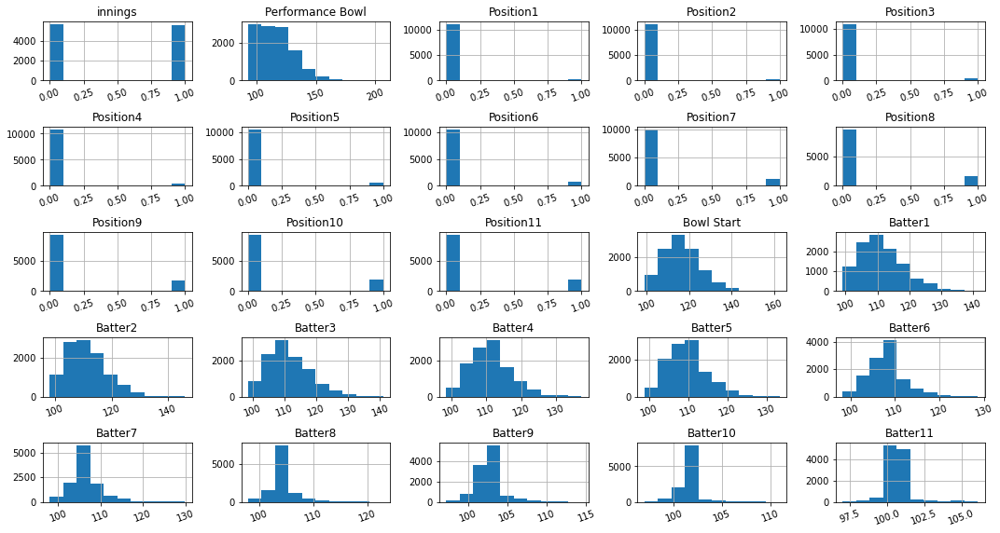

In [ ]:
# plot the histogram of numeric variables
# the hist() function considers the numeric variables only, by default
# rotate the x-axis labels by 20 degree using the parameter, 'xrot'
df.hist(xrot = 20, )

# adjust the subplots
plt.tight_layout()

# display the plot
plt.show()

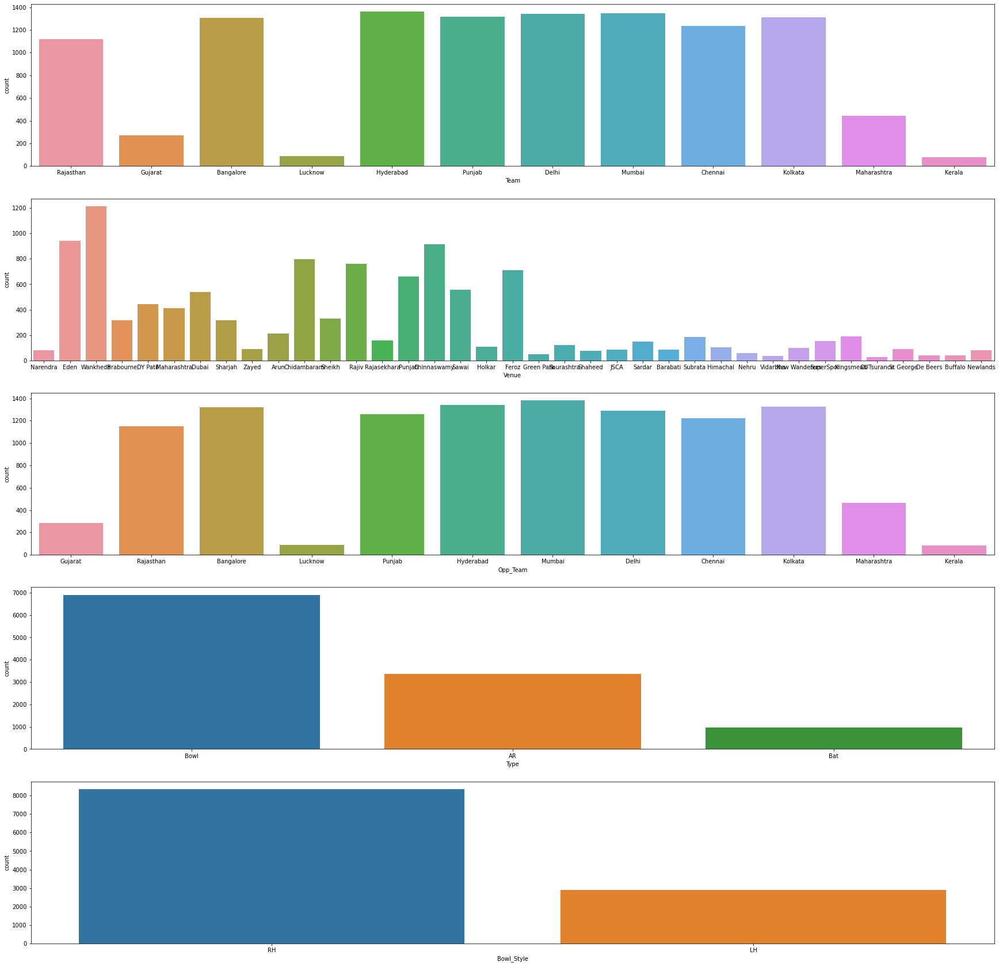

In [ ]:
# create a list of all categorical variables
# initiate an empty list to store the categorical variables
categorical=[]

# use for loop to check the data type of each variable
for column in df:

    # use 'if' statement with condition to check the categorical type
    if is_string_dtype(df[column]):

        # append the variables with 'categoric' data type in the list 'categorical'
        categorical.append(column)

# plot the count plot for each categorical variable
# set the number of rows in the subplot using the parameter, 'nrows'
# set the number of columns in the subplot using the parameter, 'ncols'
# 'figsize' sets the figure size
fig, ax = plt.subplots(5,1, figsize = (30, 30))

# use for loop to plot the count plot for each variable
for variable, subplot in zip(categorical, ax.flatten()):

    # use countplot() to plot the graph
    # pass the axes for the plot to the parameter, 'ax'
    sns.countplot(df[variable], ax = subplot)

# display the plot
plt.show()

In [ ]:
categorical

['Team', 'Venue', 'Opp_Team', 'Type', 'Bowl_Style']

## 4.4 Handling Outliers

Here we can handle the oultier using IQR with max= Q3 + 3 * IQR. It will remove only extreme outliers.

**Handling Outliers with respect to Venue**

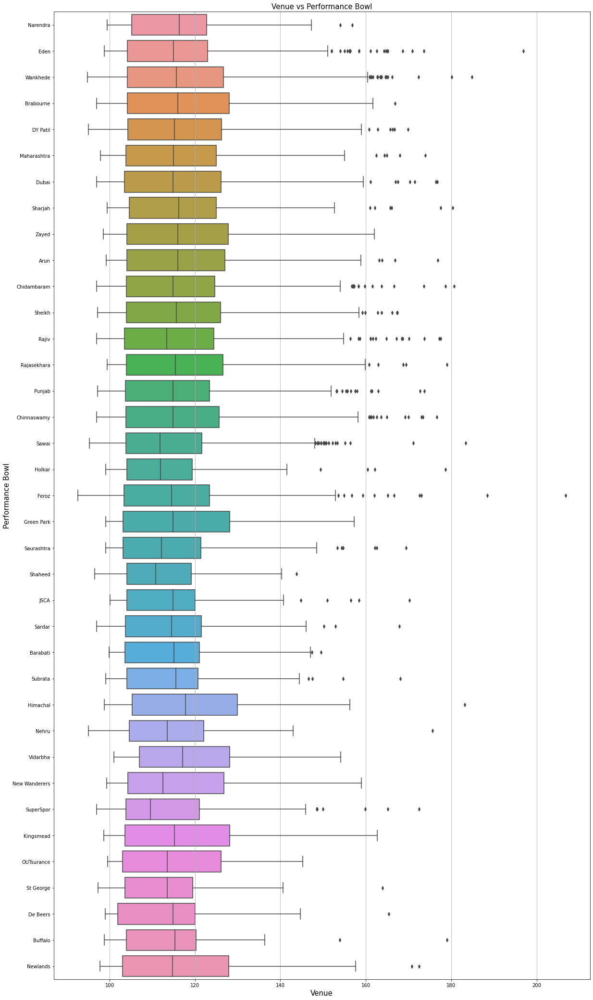

In [ ]:
# draw the boxplot for OverallQuality and the Property_Sale_Price
fig, ax = plt.subplots(figsize=(20, 37))
sns.boxplot(x="Performance Bowl", y="Venue", data= df)

# set the title of the plot and the fontsize
plt.title("Venue vs Performance Bowl", fontsize=15)

# set the xlabel and the fontsize
plt.xlabel("Venue", fontsize=15)

# set the ylabel and the fontsize
plt.ylabel("Performance Bowl", fontsize=15)
ax.xaxis.grid(True)

# display the plot
plt.show()

In [ ]:
df.shape

(11223, 30)

In [ ]:
df["Venue"].unique()

array(['Narendra', 'Eden', 'Wankhede', 'Brabourne', 'DY Patil',
       'Maharashtra', 'Dubai', 'Sharjah', 'Zayed', 'Arun', 'Chidambaram',
       'Sheikh', 'Rajiv', 'Rajasekhara', 'Punjab', 'Chinnaswamy', 'Sawai',
       'Holkar', 'Feroz', 'Green Park', 'Saurashtra', 'Shaheed', 'JSCA',
       'Sardar', 'Barabati', 'Subrata', 'Himachal', 'Nehru', 'Vidarbha',
       'New Wanderers', 'SuperSpor', 'Kingsmead', 'OUTsurance',
       'St George', 'De Beers', 'Buffalo', 'Newlands'], dtype=object)

In [ ]:
for i in df["Venue"].unique():
    Q1,Q3 = df[df["Venue"]==str(i)]["Performance Bowl"].quantile([0.25,0.75])
    IQR = Q3 - Q1
    up_lim = Q3 + 3 * IQR
    index = df[ (df['Venue'] == str(i)) & (df["Performance Bowl"] > up_lim) ].index
    df.drop(index , inplace=True)


In [ ]:
df=df.reset_index(drop=True)

In [ ]:
df.shape

(11215, 30)

**Handling Outliers with respect to Type**

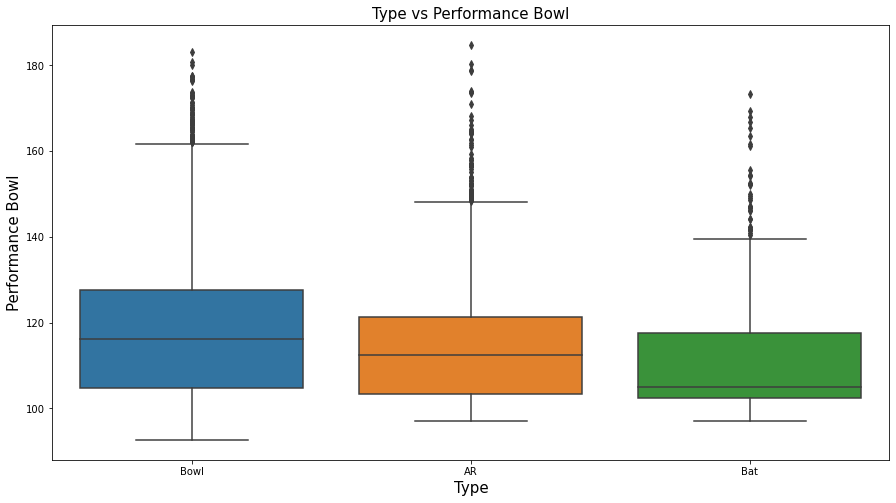

In [ ]:
# draw the boxplot for OverallQuality and the Property_Sale_Price
sns.boxplot(y="Performance Bowl", x="Type", data= df)

# set the title of the plot and the fontsize
plt.title("Type vs Performance Bowl", fontsize=15)

# set the xlabel and the fontsize
plt.xlabel("Type", fontsize=15)

# set the ylabel and the fontsize
plt.ylabel("Performance Bowl", fontsize=15)

# display the plot
plt.show()

In [ ]:
df.Type.unique()

array(['Bowl', 'AR', 'Bat'], dtype=object)

In [ ]:
for i in df["Type"].unique():
    Q1,Q3 = df[df["Type"]==str(i)]["Performance Bowl"].quantile([0.25,0.75])
    IQR = Q3 - Q1
    up_lim = Q3 + 3 * IQR
    index = df[ (df['Type'] == str(i)) & (df["Performance Bowl"] > up_lim) ].index
    df.drop(index , inplace=True)


In [ ]:
df=df.reset_index(drop=True)

In [ ]:
df.shape

(11205, 30)

**Handling Outliers with respect to Bat Style**

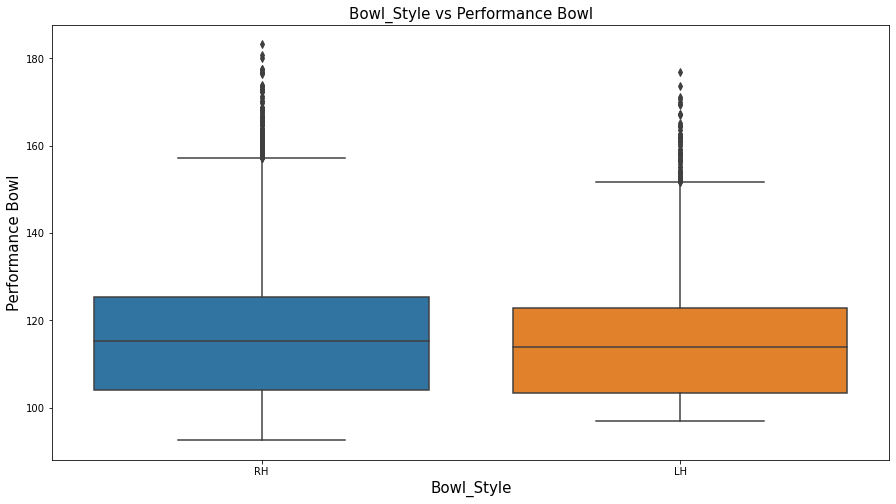

In [ ]:
# draw the boxplot for OverallQuality and the Property_Sale_Price
sns.boxplot(y="Performance Bowl", x="Bowl_Style", data= df)

# set the title of the plot and the fontsize
plt.title("Bowl_Style vs Performance Bowl", fontsize=15)

# set the xlabel and the fontsize
plt.xlabel("Bowl_Style", fontsize=15)

# set the ylabel and the fontsize
plt.ylabel("Performance Bowl", fontsize=15)

# display the plot
plt.show()

In [ ]:
df.Bowl_Style.unique()

array(['RH', 'LH'], dtype=object)

In [ ]:
for i in df["Bowl_Style"].unique():
    Q1,Q3 = df[df["Bowl_Style"]==str(i)]["Performance Bowl"].quantile([0.25,0.75])
    IQR = Q3 - Q1
    up_lim = Q3 + 3 * IQR
    index = df[ (df['Bowl_Style'] == str(i)) & (df["Performance Bowl"] > up_lim) ].index
    df.drop(index , inplace=True)


In [ ]:
df=df.reset_index(drop=True)

In [ ]:
df.shape

(11205, 30)

**Handling Outliers with respect to Team**

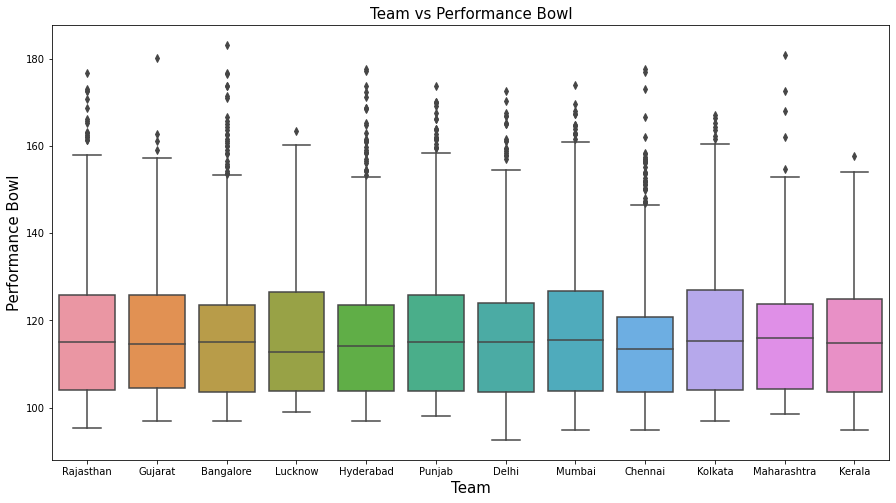

In [ ]:
# draw the boxplot for OverallQuality and the Property_Sale_Price
sns.boxplot(y="Performance Bowl", x="Team", data= df)

# set the title of the plot and the fontsize
plt.title("Team vs Performance Bowl", fontsize=15)

# set the xlabel and the fontsize
plt.xlabel("Team", fontsize=15)

# set the ylabel and the fontsize
plt.ylabel("Performance Bowl", fontsize=15)

# display the plot
plt.show()

In [ ]:
df.Team.unique()

array(['Rajasthan', 'Gujarat', 'Bangalore', 'Lucknow', 'Hyderabad',
       'Punjab', 'Delhi', 'Mumbai', 'Chennai', 'Kolkata', 'Maharashtra',
       'Kerala'], dtype=object)

In [ ]:
for i in df["Team"].unique():
    Q1,Q3 = df[df["Team"]==str(i)]["Performance Bowl"].quantile([0.25,0.75])
    IQR = Q3 - Q1
    up_lim = Q3 + 3 * IQR
    index = df[ (df['Team'] == str(i)) & (df["Performance Bowl"] > up_lim) ].index
    df.drop(index , inplace=True)



In [ ]:
df=df.reset_index(drop=True)

In [ ]:
df.shape

(11202, 30)

**Handling Outliers with respect to Opp Team**

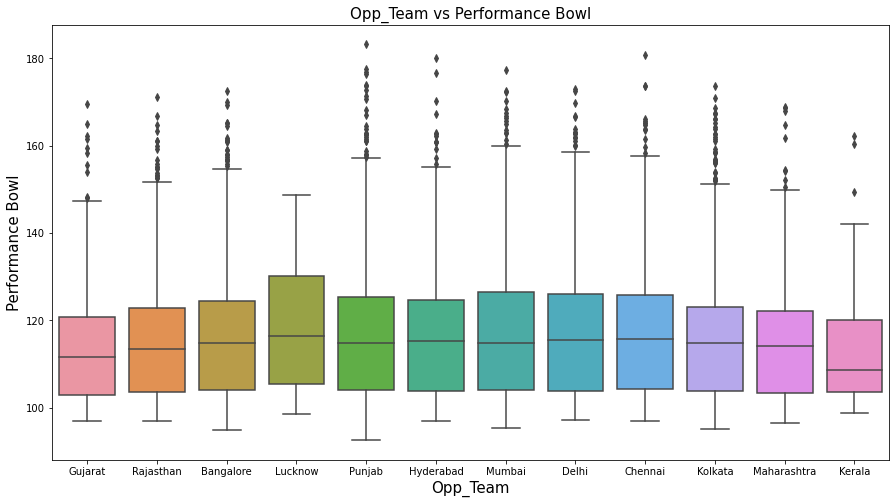

In [ ]:
# draw the boxplot for OverallQuality and the Property_Sale_Price
sns.boxplot(y="Performance Bowl", x="Opp_Team", data= df)

# set the title of the plot and the fontsize
plt.title("Opp_Team vs Performance Bowl", fontsize=15)

# set the xlabel and the fontsize
plt.xlabel("Opp_Team", fontsize=15)

# set the ylabel and the fontsize
plt.ylabel("Performance Bowl", fontsize=15)

# display the plot
plt.show()

In [ ]:
df.Opp_Team.unique()

array(['Gujarat', 'Rajasthan', 'Bangalore', 'Lucknow', 'Punjab',
       'Hyderabad', 'Mumbai', 'Delhi', 'Chennai', 'Kolkata',
       'Maharashtra', 'Kerala'], dtype=object)

In [ ]:
for i in df["Opp_Team"].unique():
    Q1,Q3 = df[df["Opp_Team"]==str(i)]["Performance Bowl"].quantile([0.25,0.75])
    IQR = Q3 - Q1
    up_lim = Q3 + 3 * IQR
    index = df[ (df['Opp_Team'] == str(i)) & (df["Performance Bowl"] > up_lim) ].index
    df.drop(index , inplace=True)



In [ ]:
df=df.reset_index(drop=True)

In [ ]:
df.shape

(11202, 30)

## 4.5 Study Correlation

In [ ]:
df.columns

Index(['innings', 'Team', 'Performance Bowl', 'Venue', 'Position1',
       'Position2', 'Position3', 'Position4', 'Position5', 'Position6',
       'Position7', 'Position8', 'Position9', 'Position10', 'Position11',
       'Opp_Team', 'Bowl Start', 'Batter1', 'Batter2', 'Batter3', 'Batter4',
       'Batter5', 'Batter6', 'Batter7', 'Batter8', 'Batter9', 'Batter10',
       'Batter11', 'Type', 'Bowl_Style'],
      dtype='object')

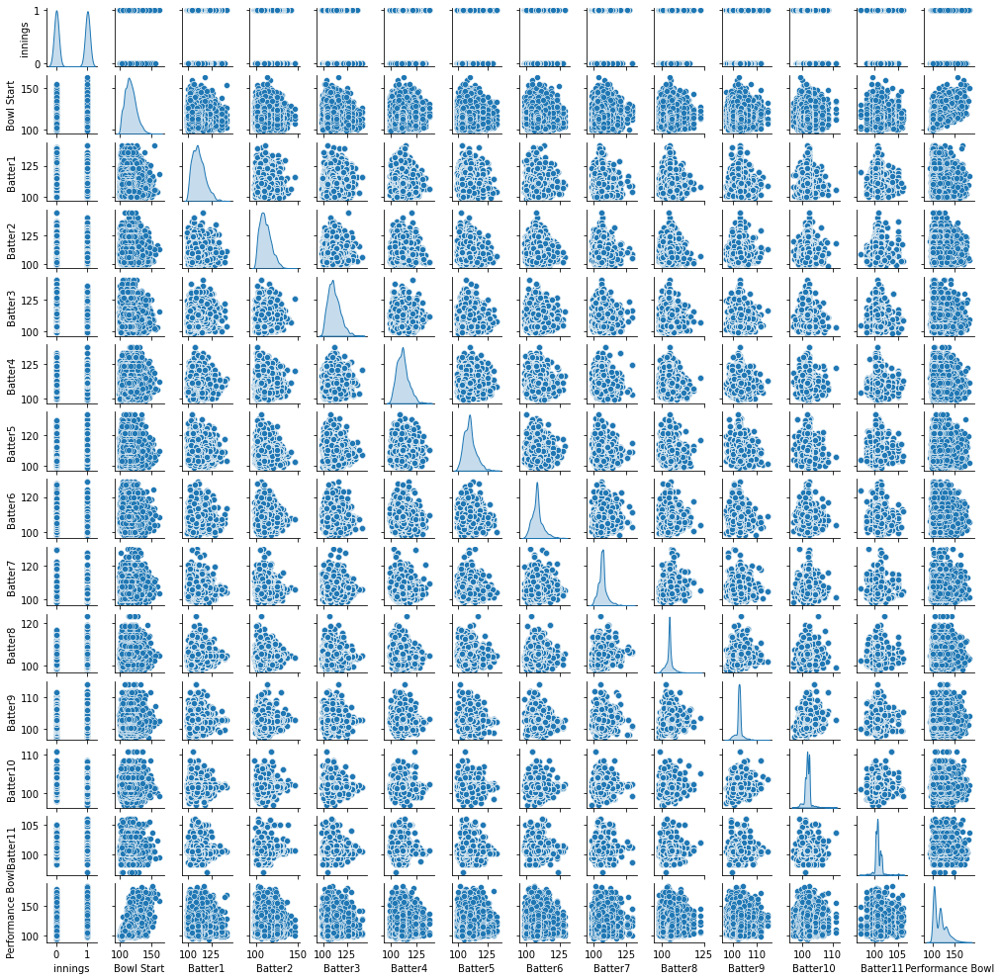

In [ ]:
# Pairplot of numeric variables

# select the columns for the pairplot
columns= ["Venue", "innings", "Bowl Start", "Type", "Bowl_Style", "Team","Opp_Team","Batter1","Batter2"
          ,"Batter3","Batter4","Batter5","Batter6","Batter7","Batter8","Batter9","Batter10","Batter11","Performance Bowl"]

# draw the pairplot such that the diagonal should be density plot and the other graphs should be scatter plot
sns.pairplot(df[columns], size=1, kind= "scatter", diag_kind="kde")

# display the plot
plt.show()

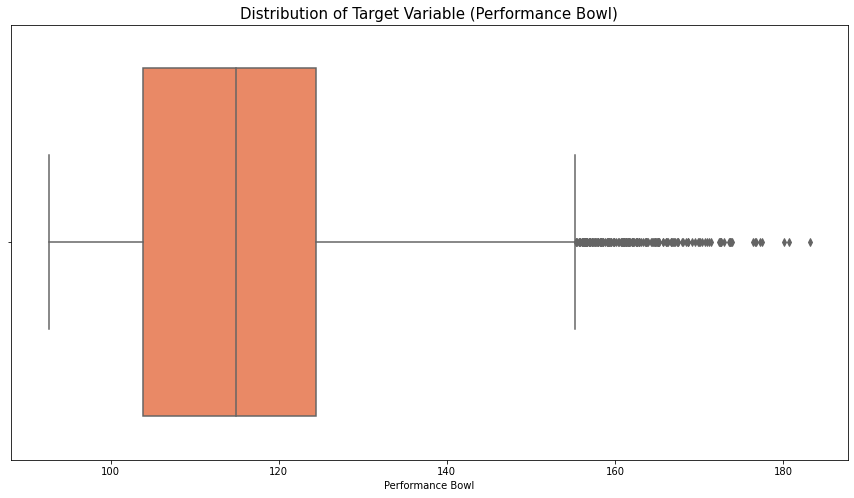

In [ ]:
# plot a boxplot of target variable to detect the outliers
sns.boxplot(df['Performance Bowl'], color='coral')

# set plot label
# set text size using 'fontsize'
plt.title('Distribution of Target Variable (Performance Bowl)', fontsize = 15)

# display the plot
plt.show()

In [ ]:
df["Performance Bowl"].max()

183.1666666666667

In [ ]:
# sort the variables on the basis of total null values in the variable
# 'isnull().sum()' returns the number of missing values in each variable
# 'ascending = False' sorts values in the descending order
# the variable with highest number of missing values will appear first
Total = df.isnull().sum().sort_values(ascending = False)

# calculate the percentage of missing values
# 'ascending = False' sorts values in the descending order
# the variable with highest percentage of missing values will appear first
Percent = (df.isnull().sum()*100/df.isnull().count()).sort_values(ascending = False)

# concat the 'Total' and 'Percent' columns using 'concat' function
# 'keys' is the list of column names
# 'axis = 1' concats along the columns
missing_data = pd.concat([Total, Percent], axis = 1, keys = ['Total', 'Percentage of Missing Values'])

# add the column containing data type of each variable
missing_data['Type'] = df[missing_data.index].dtypes
missing_data

,Total,Percentage of Missing Values,Type
innings,0,0.0,int64
Team,0,0.0,object
Type,0,0.0,object
Batter11,0,0.0,float64
Batter10,0,0.0,float64
Batter9,0,0.0,float64
Batter8,0,0.0,float64
Batter7,0,0.0,float64
Batter6,0,0.0,float64
Batter5,0,0.0,float64


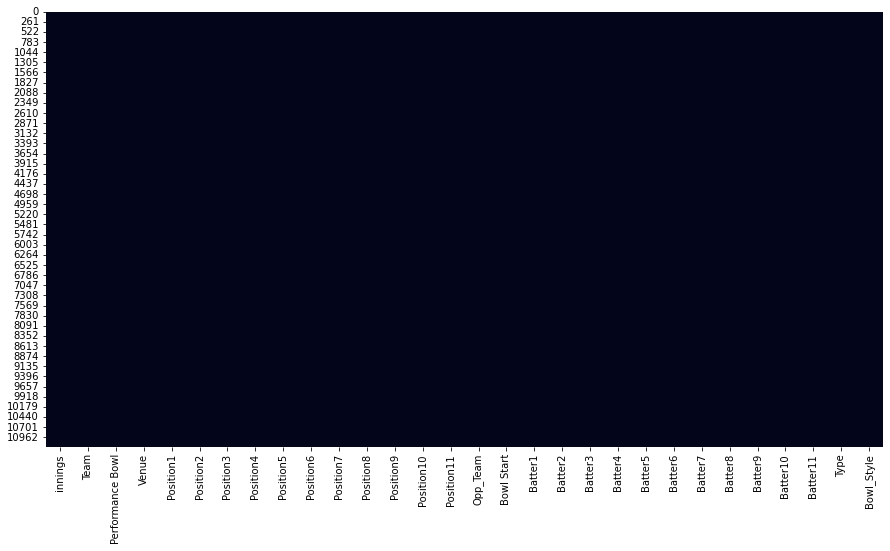

In [ ]:
# plot heatmap to visualize the null values in each column
# 'cbar = False' does not show the color axis
sns.heatmap(df.isnull(), cbar=False)

# display the plot
plt.show()

In [ ]:
# use the corr() function to generate the correlation matrix of the numeric variables
corrmat = df.corr()

# print the correlation matrix
corrmat

,innings,Performance Bowl,Position1,Position2,Position3,Position4,Position5,Position6,Position7,Position8,Position9,Position10,Position11,Bowl Start,Batter1,Batter2,Batter3,Batter4,Batter5,Batter6,Batter7,Batter8,Batter9,Batter10,Batter11
innings,1.000000,-0.025243,0.000304,-0.005824,0.009902,0.003839,0.005701,-0.013925,-0.008226,0.001526,0.002217,0.003686,0.000564,-0.003302,-0.017431,0.016190,-0.074027,-0.095188,0.012799,0.009419,-0.007903,0.031029,0.011360,-0.015469,-0.013474
Performance Bowl,-0.025243,1.000000,-0.028696,-0.036927,-0.065370,-0.056953,-0.049258,-0.065842,-0.029412,0.031659,0.041705,0.050247,0.063029,0.594575,-0.066469,-0.071774,-0.076322,-0.040276,-0.015445,0.001495,0.000277,-0.006171,0.003831,0.008186,-0.003759
Position1,0.000304,-0.028696,1.000000,-0.017297,-0.024115,-0.026932,-0.032863,-0.035890,-0.045467,-0.055360,-0.058007,-0.058494,-0.058326,-0.061942,-0.004941,-0.009999,0.005431,-0.009096,0.012949,-0.003433,-0.015037,-0.003980,0.005044,-0.015676,-0.015488
Position2,-0.005824,-0.036927,-0.017297,1.000000,-0.024570,-0.027440,-0.033483,-0.036567,-0.046325,-0.056405,-0.059102,-0.059598,-0.059426,-0.066647,0.000565,0.002683,0.003206,0.006278,0.005779,-0.011604,0.008500,0.023643,-0.016650,0.000509,-0.005732
Position3,0.009902,-0.065370,-0.024115,-0.024570,1.000000,-0.038256,-0.046680,-0.050980,-0.064584,-0.078636,-0.082396,-0.083088,-0.082849,-0.094493,-0.020135,0.000329,-0.027200,0.003584,0.012600,-0.002835,-0.015431,-0.005497,0.008751,-0.005220,-0.001574
Position4,0.003839,-0.056953,-0.026932,-0.027440,-0.038256,1.000000,-0.052135,-0.056936,-0.072130,-0.087824,-0.092023,-0.092796,-0.092529,-0.099444,-0.004734,-0.000317,-0.003995,-0.007911,-0.010122,-0.000955,0.004650,-0.010632,0.003308,-0.012502,-0.001718
Position5,0.005701,-0.049258,-0.032863,-0.033483,-0.046680,-0.052135,1.000000,-0.069475,-0.088014,-0.107164,-0.112289,-0.113232,-0.112906,-0.085304,0.005185,-0.000239,-0.000860,-0.002872,0.007407,0.007902,0.003515,0.009625,-0.006538,0.002833,-0.000746
Position6,-0.013925,-0.065842,-0.035890,-0.036567,-0.050980,-0.056936,-0.069475,1.000000,-0.096121,-0.117035,-0.122631,-0.123661,-0.123305,-0.107603,-0.001636,-0.010578,0.007006,-0.002576,-0.004733,-0.009547,-0.008215,0.001682,0.001204,0.010468,0.010165
Position7,-0.008226,-0.029412,-0.045467,-0.046325,-0.064584,-0.072130,-0.088014,-0.096121,1.000000,-0.148265,-0.155355,-0.156659,-0.156208,-0.051281,0.002622,0.003681,0.010175,0.005231,-0.008405,0.001742,0.000289,-0.002372,-0.010627,0.003525,-0.003581
Position8,0.001526,0.031659,-0.055360,-0.056405,-0.078636,-0.087824,-0.107164,-0.117035,-0.148265,1.000000,-0.189158,-0.190745,-0.190196,0.044943,0.003700,0.000291,-0.002295,0.000418,0.000409,0.004005,0.004595,-0.002856,0.001881,-0.001712,0.000775


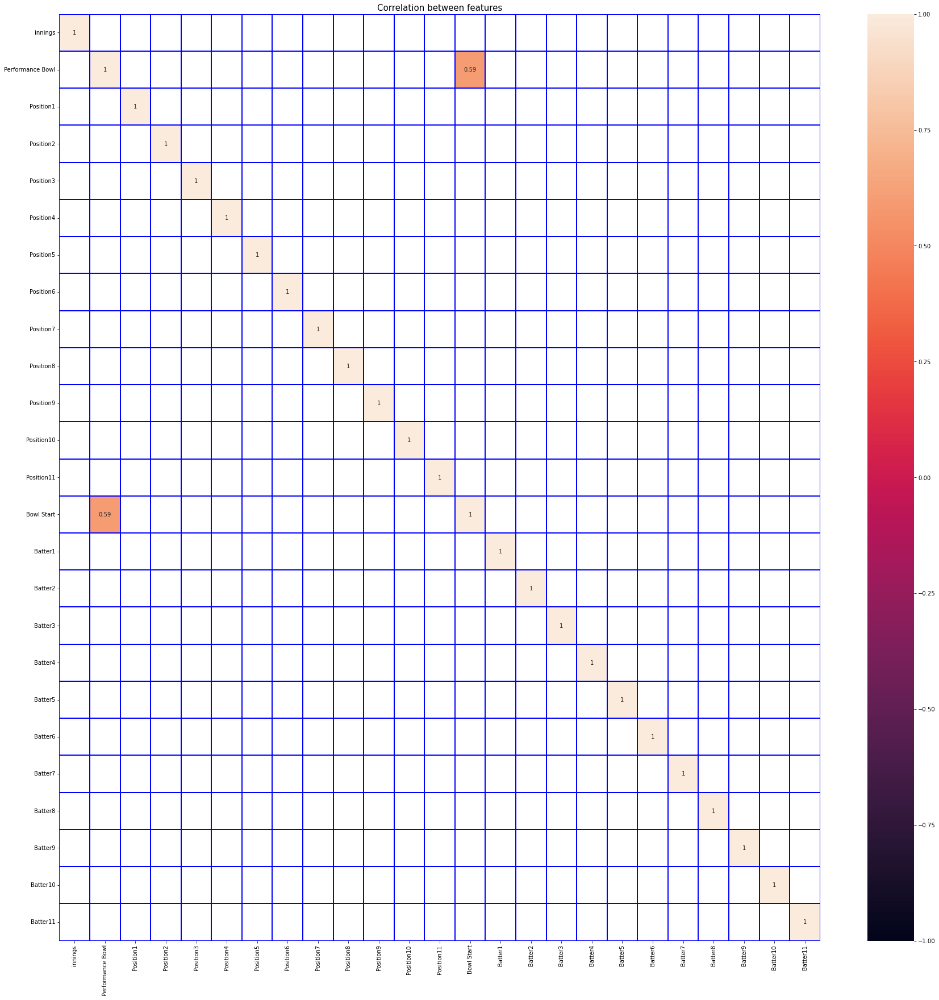

In [ ]:
correlation=df.corr()
plt.figure(figsize=(30, 30))
sns.heatmap(correlation[(correlation >= 0.3) | (correlation <= -0.3)],
            annot=True,linewidths=.1,linecolor="blue",vmax = 1, vmin = -1)
plt.title('Correlation between features', fontsize=15)
plt.show()

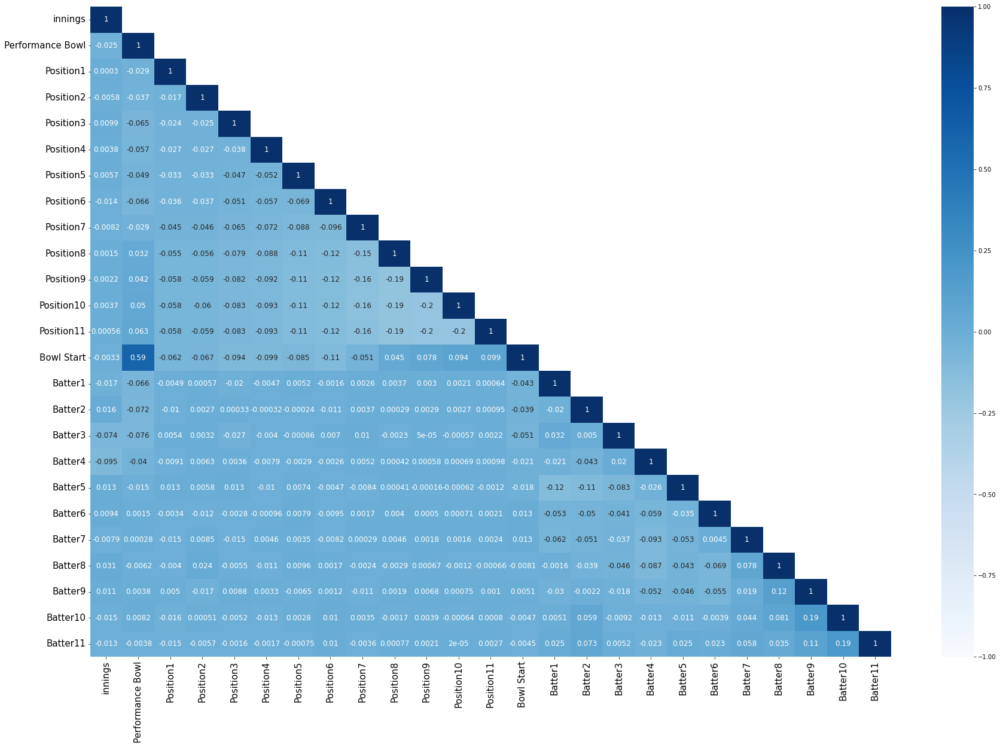

In [ ]:
# set the plot size
# pass the required height and width to the parameter, 'figsize'
plt.figure(figsize = (30,20))

# use 'mask' to plot a upper triangular correlation matrix
# 'tril_indices_from' returns the indices for the lower-triangle of matrix
# 'k = -1' consider the diagonal of the matrix
mask = np.zeros_like(corrmat)
mask[np.triu_indices_from(mask, k = 1)] = True

# plot the heat map
# corr: give the correlation matrix
# cmap: color code used for plotting
# vmax: gives a maximum range of values for the chart
# vmin: gives a minimum range of values for the chart
# annot: prints the correlation values in the chart
# annot_kws: sets the font size of the annotation
# mask: mask the upper traingular matrix values
sns.heatmap(corrmat, cmap = 'Blues', vmax = 1.0, vmin = -1.0, annot = True, annot_kws = {"size": 12}, mask = mask)

# set the size of x and y axes labels
# set text size using 'fontsize'
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)

# display the plot
plt.show()

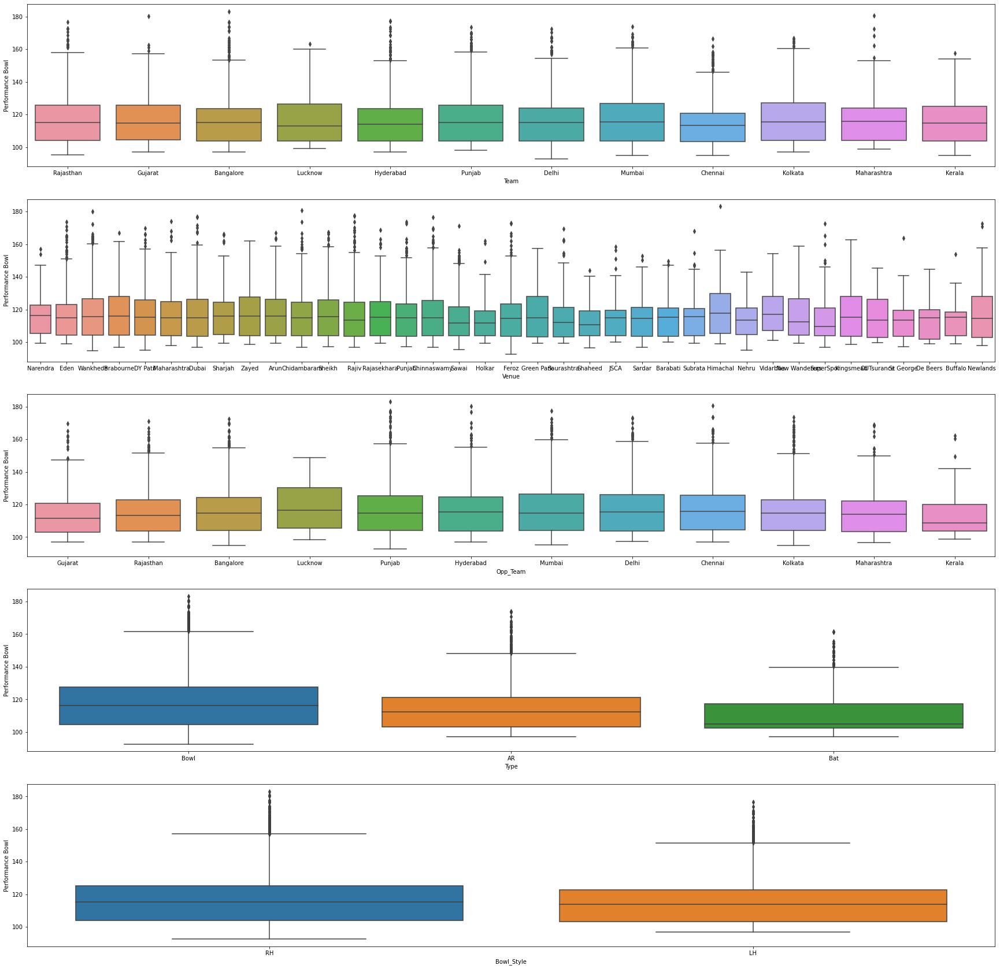

In [ ]:
# create a list of all categorical variables
# initiate an empty list to store the categorical variables
categorical=[]

# use for loop to check the data type of each variable
for column in df:

    # use 'if' statement with condition to check the categorical type
    if is_string_dtype(df[column]):

        # append the variables with 'categoric' data type in the list 'categorical'
        categorical.append(column)

# plot the boxplot for each categorical and target variable
# set the number of rows in the subplot using the parameter, 'nrows'
# set the number of columns in the subplot using the parameter, 'ncols'
# 'figsize' sets the figure size
fig, ax = plt.subplots(nrows = 5, ncols = 1, figsize = (30, 30))

# use for loop to plot the boxplot for each categoric and target variable
for variable, subplot in zip(categorical, ax.flatten()):

    # use boxplot() to plot the graph
    # pass the axes for the plot to the parameter, 'ax'
    sns.boxplot(x = variable, y = 'Performance Bowl', data = df, ax = subplot)

# display the plot
plt.show()

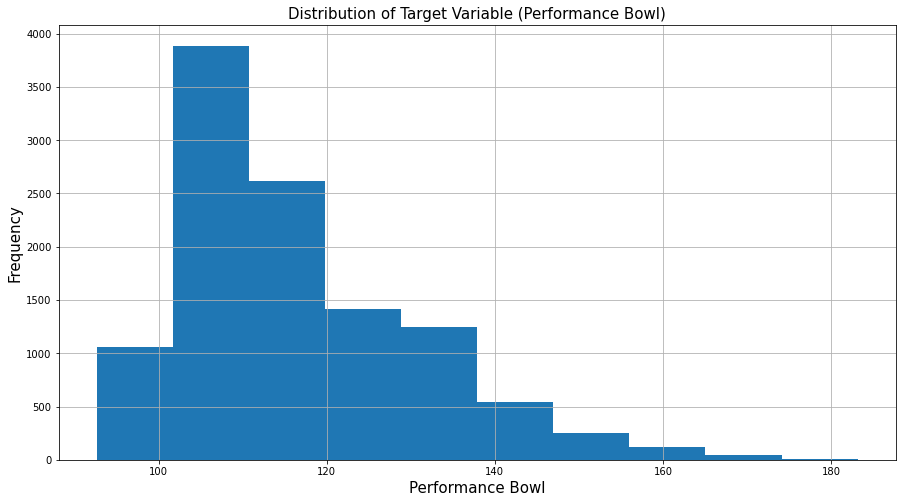

In [ ]:
# check the distribution of target variable
df["Performance Bowl"].hist()

# add plot and axes labels
# set text size using 'fontsize'
plt.title('Distribution of Target Variable (Performance Bowl)', fontsize = 15)
plt.xlabel('Performance Bowl', fontsize = 15)
plt.ylabel('Frequency', fontsize = 15)

# display the plot
plt.show()

In [ ]:
# normality test using jarque_bera()
# the test returns the the test statistics and the p-value of the test
stat, p = jarque_bera(df["Performance Bowl"])

# to print the numeric outputs of the jarque_bera test upto 3 decimal places
# %.3f: returns the a floating point with 3 decimal digit accuracy
# the '%' holds the place where the number is to be printed
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

# display the conclusion
# set the level of significance to 0.05
alpha = 0.05

# if the p-value is greater than alpha print we accept alpha
# if the p-value is less than alpha print we reject alpha
if p > alpha:
    print('The data is normally distributed (fail to reject H0)')
else:
    print('The data is not normally distributed (reject H0)')

Statistics=2313.306, p-value=0.000
The data is not normally distributed (reject H0)


In [ ]:
# log transformation for normality using np.log()
df['log Performance Bowl'] = np.log(df['Performance Bowl'])

# display first 5 rows of the data
df.head()

,innings,Team,Performance Bowl,Venue,Position1,Position2,Position3,Position4,Position5,Position6,Position7,Position8,Position9,Position10,Position11,Opp_Team,Bowl Start,Batter1,Batter2,Batter3,Batter4,Batter5,Batter6,Batter7,Batter8,Batter9,Batter10,Batter11,Type,Bowl_Style,log Performance Bowl
0,0,Rajasthan,115.214286,Narendra,0,0,0,0,0,0,0,0,0,0,1,Gujarat,110.510876,105.176514,135.15678,110.161804,105.806968,102.345436,110.112605,105.049592,106.21597,106.291902,102.236553,100.706896,Bowl,RH,4.746794
1,0,Rajasthan,117.054545,Narendra,0,0,0,0,0,0,0,0,0,1,0,Gujarat,111.707792,105.176514,135.15678,110.161804,105.806968,102.345436,110.112605,105.049592,106.21597,106.291902,102.236553,100.706896,Bowl,LH,4.762640
2,0,Rajasthan,105.201299,Narendra,0,0,0,0,0,0,0,0,1,0,0,Gujarat,109.647523,105.176514,135.15678,110.161804,105.806968,102.345436,110.112605,105.049592,106.21597,106.291902,102.236553,100.706896,Bowl,RH,4.655876
3,0,Rajasthan,118.300000,Narendra,0,0,0,0,0,0,1,0,0,0,0,Gujarat,119.865873,105.176514,135.15678,110.161804,105.806968,102.345436,110.112605,105.049592,106.21597,106.291902,102.236553,100.706896,Bowl,RH,4.773224
4,0,Rajasthan,154.000000,Narendra,0,0,0,1,0,0,0,0,0,0,0,Gujarat,127.045503,105.176514,135.15678,110.161804,105.806968,102.345436,110.112605,105.049592,106.21597,106.291902,102.236553,100.706896,AR,RH,5.036953


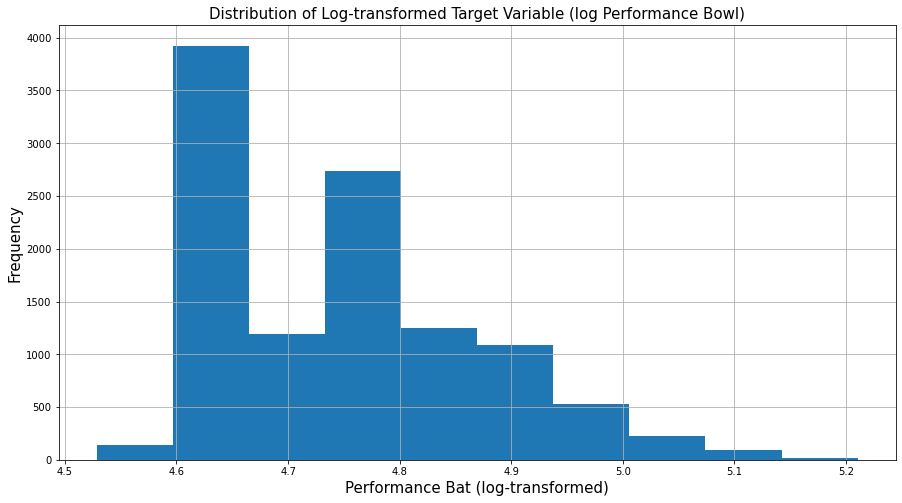

In [ ]:
# recheck for normality
# plot the histogram using hist
df["log Performance Bowl"].hist()

# add plot and axes labels
# set text size using 'fontsize'
plt.title('Distribution of Log-transformed Target Variable (log Performance Bowl)', fontsize = 15)
plt.xlabel('Performance Bat (log-transformed)', fontsize = 15)
plt.ylabel('Frequency', fontsize = 15)

# display the plot
plt.show()

In [ ]:
# check the normality by jarque_bera test
# the test returns the the test statistics and the p-value of the test
stat, pv = jarque_bera(df['log Performance Bowl'])

# to print the numeric outputs of the jarque_bera test upto 3 decimal places
# %.3f: returns the a floating point with 3 decimal digit accuracy
# the '%' holds the place where the number is to be printed
print('Statistics=%.3f, p-value=%.3f' % (stat, pv))

# display the conclusion
# set the level of significance to 0.05
alpha = 0.05

# if the p-value is greater than alpha print we accept alpha
# if the p-value is less than alpha print we reject alpha
if pv > alpha:
    print('The data is normally distributed (fail to reject H0)')
else:
    print('The data is not normally distributed (reject H0)')

Statistics=1123.093, p-value=0.000
The data is not normally distributed (reject H0)


## 4.6 Feature Scaling

Here we can do the following:

1.One-Hot Encoding

2.Normalization using minmaxscaler()

In [ ]:
# filter the numerical features in the dataset using select_dtypes()
# include=np.number: selects the numeric features
df_numeric_features = df[['Bowl Start','Batter1','Batter2','Batter3','Batter4','Batter5','Batter6','Batter7',
                          'Batter8','Batter9','Batter10','Batter11']]
df_target=df[['Performance Bowl','log Performance Bowl']]
df_nominal_features=df[['innings','Position1','Position2', 'Position3', 'Position4', 'Position5', 'Position6',
       'Position7', 'Position8', 'Position9', 'Position10', 'Position11',]]

# display the numeric features
print(df_numeric_features.columns)
df_nominal_features.columns

Index(['Bowl Start', 'Batter1', 'Batter2', 'Batter3', 'Batter4', 'Batter5',
       'Batter6', 'Batter7', 'Batter8', 'Batter9', 'Batter10', 'Batter11'],
      dtype='object')


Index(['innings', 'Position1', 'Position2', 'Position3', 'Position4',
       'Position5', 'Position6', 'Position7', 'Position8', 'Position9',
       'Position10', 'Position11'],
      dtype='object')

In [ ]:
# filter the categorical features in the dataset using select_dtypes()
# include=[np.object]: selects the categoric features
df_categoric_features = df.select_dtypes(include = object)

# display categorical features
df_categoric_features.columns

Index(['Team', 'Venue', 'Opp_Team', 'Type', 'Bowl_Style'], dtype='object')

### 4.6.1 One Hot Encoding

In [ ]:
df_Encode = OneHotEncoder(df_categoric_features.columns
                           ,use_cat_names=True)
hot = df_Encode.fit_transform(df_categoric_features)

In [ ]:
hot.columns

Index(['Team_Rajasthan', 'Team_Gujarat', 'Team_Bangalore', 'Team_Lucknow',
       'Team_Hyderabad', 'Team_Punjab', 'Team_Delhi', 'Team_Mumbai',
       'Team_Chennai', 'Team_Kolkata', 'Team_Maharashtra', 'Team_Kerala',
       'Venue_Narendra', 'Venue_Eden', 'Venue_Wankhede', 'Venue_Brabourne',
       'Venue_DY Patil', 'Venue_Maharashtra', 'Venue_Dubai', 'Venue_Sharjah',
       'Venue_Zayed', 'Venue_Arun', 'Venue_Chidambaram', 'Venue_Sheikh',
       'Venue_Rajiv', 'Venue_Rajasekhara', 'Venue_Punjab', 'Venue_Chinnaswamy',
       'Venue_Sawai', 'Venue_Holkar', 'Venue_Feroz', 'Venue_Green Park',
       'Venue_Saurashtra', 'Venue_Shaheed', 'Venue_JSCA', 'Venue_Sardar',
       'Venue_Barabati', 'Venue_Subrata', 'Venue_Himachal', 'Venue_Nehru',
       'Venue_Vidarbha', 'Venue_New Wanderers', 'Venue_SuperSpor',
       'Venue_Kingsmead', 'Venue_OUTsurance', 'Venue_St George',
       'Venue_De Beers', 'Venue_Buffalo', 'Venue_Newlands', 'Opp_Team_Gujarat',
       'Opp_Team_Rajasthan', 'Opp_Team_Ba

In [ ]:
df_One_hot=hot.drop(['Venue_Chinnaswamy','Type_AR','Bowl_Style_RH','Team_Kolkata','Opp_Team_Bangalore'],axis=1)

In [ ]:
df_One_hot.columns

Index(['Team_Rajasthan', 'Team_Gujarat', 'Team_Bangalore', 'Team_Lucknow',
       'Team_Hyderabad', 'Team_Punjab', 'Team_Delhi', 'Team_Mumbai',
       'Team_Chennai', 'Team_Maharashtra', 'Team_Kerala', 'Venue_Narendra',
       'Venue_Eden', 'Venue_Wankhede', 'Venue_Brabourne', 'Venue_DY Patil',
       'Venue_Maharashtra', 'Venue_Dubai', 'Venue_Sharjah', 'Venue_Zayed',
       'Venue_Arun', 'Venue_Chidambaram', 'Venue_Sheikh', 'Venue_Rajiv',
       'Venue_Rajasekhara', 'Venue_Punjab', 'Venue_Sawai', 'Venue_Holkar',
       'Venue_Feroz', 'Venue_Green Park', 'Venue_Saurashtra', 'Venue_Shaheed',
       'Venue_JSCA', 'Venue_Sardar', 'Venue_Barabati', 'Venue_Subrata',
       'Venue_Himachal', 'Venue_Nehru', 'Venue_Vidarbha',
       'Venue_New Wanderers', 'Venue_SuperSpor', 'Venue_Kingsmead',
       'Venue_OUTsurance', 'Venue_St George', 'Venue_De Beers',
       'Venue_Buffalo', 'Venue_Newlands', 'Opp_Team_Gujarat',
       'Opp_Team_Rajasthan', 'Opp_Team_Lucknow', 'Opp_Team_Punjab',
       'Op

### 4.6.2 Normalization

In [ ]:
df_numeric_features.columns

Index(['Bowl Start', 'Batter1', 'Batter2', 'Batter3', 'Batter4', 'Batter5',
       'Batter6', 'Batter7', 'Batter8', 'Batter9', 'Batter10', 'Batter11'],
      dtype='object')

In [ ]:
minmax_scale = MinMaxScaler()
# fit on the train dataset
minmax_scale.fit((df_numeric_features))
# transform the train dataset columns ("Experience" and "Salary")
df_minmax = minmax_scale.transform(df_numeric_features)
print(type(df_minmax))
df_minmax_new = pd.DataFrame(df_minmax,columns=['Bowl Start', 'Batter1', 'Batter2', 'Batter3', 'Batter4', 'Batter5',
                                                'Batter6', 'Batter7', 'Batter8', 'Batter9', 'Batter10', 'Batter11'])
df_minmax_new

<class 'numpy.ndarray'>


,Bowl Start,Batter1,Batter2,Batter3,Batter4,Batter5,Batter6,Batter7,Batter8,Batter9,Batter10,Batter11
0,0.183532,0.144470,0.773703,0.275015,0.187648,0.106870,0.390890,0.220875,0.331042,0.530017,0.377932,0.406672
1,0.202290,0.144470,0.773703,0.275015,0.187648,0.106870,0.390890,0.220875,0.331042,0.530017,0.377932,0.406672
2,0.170002,0.144470,0.773703,0.275015,0.187648,0.106870,0.390890,0.220875,0.331042,0.530017,0.377932,0.406672
3,0.330143,0.144470,0.773703,0.275015,0.187648,0.106870,0.390890,0.220875,0.331042,0.530017,0.377932,0.406672
4,0.442662,0.144470,0.773703,0.275015,0.187648,0.106870,0.390890,0.220875,0.331042,0.530017,0.377932,0.406672
5,0.246901,0.144470,0.773703,0.275015,0.187648,0.106870,0.390890,0.220875,0.331042,0.530017,0.377932,0.406672
6,0.285084,0.083931,0.283917,0.252957,0.533856,0.737815,0.331434,0.272447,0.247720,0.340709,0.333399,0.371562
7,0.349356,0.083931,0.283917,0.252957,0.533856,0.737815,0.331434,0.272447,0.247720,0.340709,0.333399,0.371562
8,0.196437,0.083931,0.283917,0.252957,0.533856,0.737815,0.331434,0.272447,0.247720,0.340709,0.333399,0.371562
9,0.426750,0.083931,0.283917,0.252957,0.533856,0.737815,0.331434,0.272447,0.247720,0.340709,0.333399,0.371562


In [ ]:
df = pd.concat([df_minmax_new,df_One_hot,df_nominal_features,df_target], axis=1)

In [ ]:
df.head()

,Bowl Start,Batter1,Batter2,Batter3,Batter4,Batter5,Batter6,Batter7,Batter8,Batter9,Batter10,Batter11,Team_Rajasthan,Team_Gujarat,Team_Bangalore,Team_Lucknow,Team_Hyderabad,Team_Punjab,Team_Delhi,Team_Mumbai,Team_Chennai,Team_Maharashtra,Team_Kerala,Venue_Narendra,Venue_Eden,Venue_Wankhede,Venue_Brabourne,Venue_DY Patil,Venue_Maharashtra,Venue_Dubai,Venue_Sharjah,Venue_Zayed,Venue_Arun,Venue_Chidambaram,Venue_Sheikh,Venue_Rajiv,Venue_Rajasekhara,Venue_Punjab,Venue_Sawai,Venue_Holkar,Venue_Feroz,Venue_Green Park,Venue_Saurashtra,Venue_Shaheed,Venue_JSCA,Venue_Sardar,Venue_Barabati,Venue_Subrata,Venue_Himachal,Venue_Nehru,Venue_Vidarbha,Venue_New Wanderers,Venue_SuperSpor,Venue_Kingsmead,Venue_OUTsurance,Venue_St George,Venue_De Beers,Venue_Buffalo,Venue_Newlands,Opp_Team_Gujarat,Opp_Team_Rajasthan,Opp_Team_Lucknow,Opp_Team_Punjab,Opp_Team_Hyderabad,Opp_Team_Mumbai,Opp_Team_Delhi,Opp_Team_Chennai,Opp_Team_Kolkata,Opp_Team_Maharashtra,Opp_Team_Kerala,Type_Bowl,Type_Bat,Bowl_Style_LH,innings,Position1,Position2,Position3,Position4,Position5,Position6,Position7,Position8,Position9,Position10,Position11,Performance Bowl,log Performance Bowl
0,0.183532,0.14447,0.773703,0.275015,0.187648,0.10687,0.39089,0.220875,0.331042,0.530017,0.377932,0.406672,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,115.214286,4.746794
1,0.202290,0.14447,0.773703,0.275015,0.187648,0.10687,0.39089,0.220875,0.331042,0.530017,0.377932,0.406672,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,117.054545,4.762640
2,0.170002,0.14447,0.773703,0.275015,0.187648,0.10687,0.39089,0.220875,0.331042,0.530017,0.377932,0.406672,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,105.201299,4.655876
3,0.330143,0.14447,0.773703,0.275015,0.187648,0.10687,0.39089,0.220875,0.331042,0.530017,0.377932,0.406672,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,118.300000,4.773224
4,0.442662,0.14447,0.773703,0.275015,0.187648,0.10687,0.39089,0.220875,0.331042,0.530017,0.377932,0.406672,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,154.000000,5.036953


## 5. Random Forest

## 5.1 Random Forest Model

In this section we build a model using random forest regressor.

In order to build the model, we do the following:

1. Split the features and target into seperate data frames
2. Split the data into training and test sets
3. Build model
4. Predict the values using test set
5. Compute accuracy measures
6. Tabulate the results

In [ ]:
df_dummy=df.copy()
# separate the independent and dependent variables
# drop(): drops the specified columns
# axis=1: specifies that the column is to be dropped
X = df_dummy.drop(["Performance Bowl",'log Performance Bowl'], axis = 1)

# extract the target variable from the data set
y = df_dummy[['log Performance Bowl']]

# split data into train subset and test subset for predictor and target variables
# 'test_size' returns the proportion of data to be included in the test set
# set 'random_state' to generate the same dataset each time you run the code
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 1)

# check the dimensions of the train & test subset for v
# print dimension of predictors train set
print("The shape of X_train is:",X_train.shape)

# print dimension of predictors test set
print("The shape of X_test is:",X_test.shape)

# print dimension of target train set
print("The shape of y_train is:",y_train.shape)

# print dimension of target test set
print("The shape of y_test is:",y_test.shape)

The shape of X_train is: (7841, 85)
The shape of X_test is: (3361, 85)
The shape of y_train is: (7841, 1)
The shape of y_test is: (3361, 1)


In [ ]:
#intantiate the regressor
rf_reg = RandomForestRegressor(n_estimators=100, random_state=10, warm_start=True, oob_score=True)

# fit the regressor with training dataset
rf_reg.fit(X_train, y_train)

RandomForestRegressor(oob_score=True, random_state=10, warm_start=True)

In [ ]:
# predict the values on test dataset using predict()
y_pred = rf_reg.predict(X_test)

In [ ]:
# Calculate MAE
rf_reg_MAE = metrics.mean_absolute_error(y_test, y_pred)
print('Mean Absolute Error (MAE):', rf_reg_MAE)

# Calculate MSE
rf_reg_MSE = metrics.mean_squared_error(y_test, y_pred)
print('Mean Squared Error (MSE):', rf_reg_MSE)

# Calculate RMSE
rf_reg_RMSE = np.sqrt(metrics.mean_squared_error(y_test, y_pred))
print('Root Mean Squared Error (RMSE):', rf_reg_RMSE)

#Calculate MAPE
rf_reg_MAPE=metrics.mean_absolute_percentage_error(y_test, y_pred)
print('Mean Absolute Percentage Error(MAPE):', rf_reg_MAPE)

Mean Absolute Error (MAE): 0.07690269118409995
Mean Squared Error (MSE): 0.009549951778481542
Root Mean Squared Error (RMSE): 0.09772385470539699
Mean Absolute Percentage Error(MAPE): 0.016102797162632583


In [ ]:
# create the result table for all accuracy scores
# accuracy measures considered for model comparision are RMSE
# create a list of column names
cols = ['Model', 'MAE', 'MSE', 'RMSE','MAPE']

# create a empty dataframe of the colums
# columns: specifies the columns to be selected
result_tabulation = pd.DataFrame(columns = cols)

# compile the required information
rf_reg_metrics = pd.Series({'Model': "Random Forest ",
                     'MAE':rf_reg_MAE,
                     'MSE': rf_reg_MSE,
                     'RMSE': rf_reg_RMSE,
                     'MAPE':rf_reg_MAPE
                   })

# append our result table using append()
# ignore_index=True: does not use the index labels
# python can only append a Series if ignore_index=True or if the Series has a name
result_tabulation = result_tabulation.append(rf_reg_metrics, ignore_index = True)

# print the result table
result_tabulation

,Model,MAE,MSE,RMSE,MAPE
0,Random Forest,0.076903,0.00955,0.097724,0.016103


In [ ]:
# predict the values on train dataset using predict()
y_pred_train = rf_reg.predict(X_train)

In [ ]:
# Calculate MAE
rf_reg_MAE_train = metrics.mean_absolute_error(y_train, y_pred_train)
print('Mean Absolute Error (MAE)train:', rf_reg_MAE_train)

# Calculate MSE
rf_reg_MSE_train = metrics.mean_squared_error(y_train, y_pred_train)
print('Mean Squared Error (MSE)train:', rf_reg_MSE_train)

# Calculate RMSE
rf_reg_RMSE_train = np.sqrt(metrics.mean_squared_error(y_train, y_pred_train))
print('Root Mean Squared Error (RMSE)train:', rf_reg_RMSE_train)

#Calculate MAPE
rf_reg_MAPE_train=metrics.mean_absolute_percentage_error(y_train, y_pred_train)
print('Mean Absolute Percentage Error(MAPE):', rf_reg_MAPE_train)

Mean Absolute Error (MAE)train: 0.027754375242095015
Mean Squared Error (MSE)train: 0.0012764953771874513
Root Mean Squared Error (RMSE)train: 0.03572807547556195
Mean Absolute Percentage Error(MAPE): 0.005812109541393167


In [ ]:
# create the result table for all accuracy scores
# accuracy measures considered for model comparision are MAE, MSE, RMSE
# create a list of column names
#cols = ['Model', 'MAE', 'MSE', 'RMSE']

# create a empty dataframe of the colums
# columns: specifies the columns to be selected
#result_tabulation = pd.DataFrame(columns = cols)

# compile the required information
rf_reg_metrics = pd.Series({'Model': "Random Forest train ",
                     'MAE':rf_reg_MAE_train,
                     'MSE': rf_reg_MSE_train,
                     'RMSE': rf_reg_RMSE_train,
                     'MAPE': rf_reg_MAPE_train
                   })

# append our result table using append()
# ignore_index=True: does not use the index labels
# python can only append a Series if ignore_index=True or if the Series has a name
result_tabulation = result_tabulation.append(rf_reg_metrics, ignore_index = True)

# print the result table
result_tabulation

,Model,MAE,MSE,RMSE,MAPE
0,Random Forest,0.076903,0.00955,0.097724,0.016103
1,Random Forest train,0.027754,0.001276,0.035728,0.005812


## 5.2 Random Forest with GridSearchCV

Now we build a random forest using the GridSearchCV. We start with our original data set gradually proceeding with our analysis

To build a Random Forest using GridSearchCV, we do the following:
1. Use GridSearch to obtain the optimal values of hyperparameters
2. Build the model using the hyperparameters obtained in step 1
3. Do predictions on the test set
4. Compute accuracy measures
5. Tabulate the results

In [ ]:
# create a dictionary with hyperparameters and its values
# pass the n_estimators
# pass the list of values to 'min_samples_split' that assigns minimum number of samples to split an internal node
# pass the list of values to 'max_depth' that assigns maximum depth of the tree
# pass the list of values to 'min_samples_leaf' that assigns minimum number of samples required at the terminal/leaf node
# pass the list of values to 'max_leaf_nodes' that assigns maximum number of leaf nodes in the tree
tuned_paramaters = [{'n_estimators': [ 85, 100],
                     'min_samples_split': [15,20],
                     'max_depth': [8, 10],
                    }]

In [ ]:
# instantiate the 'RandomForestRegressor'
# pass the 'random_state' to obtain the same samples for each time you run the code
rf_reg_CV= RandomForestRegressor(random_state = 10)

# use GridSearchCV() to find the optimal value of the hyperparameters
# n_estimator: pass the decision tree classifier model
# param_grid: pass the list 'tuned_parameters'
# cv: number of folds in k-fold i.e. here cv = 10
grid = GridSearchCV(estimator = rf_reg_CV,
                         param_grid = tuned_paramaters,
                         cv = 10)

# fit the model on X_train and y_train using fit()
dt_grid = grid.fit(X_train, y_train)

# get the best parameters
print('Best parameters for random forest regressor: ', dt_grid.best_params_, '\n')

Best parameters for random forest regressor:  {'max_depth': 8, 'min_samples_split': 20, 'n_estimators': 85} 



In [ ]:
# instantiate the 'RandomForestRegressor'
# 'best_params_' returns the dictionary containing best parameter values and parameter name
# 'get()' returns the value of specified parameter
# pass the 'random_state' to obtain the same samples for each time you run the code
dt_grid_model = RandomForestRegressor(n_estimators = dt_grid.best_params_.get('n_estimators'),
                                       max_depth = dt_grid.best_params_.get('max_depth'),
                                       min_samples_split = dt_grid.best_params_.get('min_samples_split'),
                                       random_state = 10)

# use fit() to fit the model on the train set
dt_grid_model = dt_grid_model.fit(X_train, y_train)

In [ ]:
# predict the class labels using 'X_test'
y_pred_cv = dt_grid_model.predict(X_test)

In [ ]:
# calculate MAE
rf_reg_CV_MAE = metrics.mean_absolute_error(y_test, y_pred_cv)
print('Mean Absolute Error (MAE):', rf_reg_CV_MAE)

# calculate MSE
rf_reg_CV_MSE = metrics.mean_squared_error(y_test, y_pred_cv)
print('Mean Squared Error (MSE):', rf_reg_CV_MSE)

# calculate RMSE
rf_reg_CV_RMSE = np.sqrt(metrics.mean_squared_error(y_test, y_pred_cv))
print('Root Mean Squared Error (RMSE):', rf_reg_CV_RMSE)

#Calculate MAPE
rf_reg_CV_MAPE=metrics.mean_absolute_percentage_error(y_test, y_pred_cv)
print('Mean Absolute Percentage Error(MAPE):', rf_reg_CV_MAPE)

Mean Absolute Error (MAE): 0.07381462807787172
Mean Squared Error (MSE): 0.008641936217703896
Root Mean Squared Error (RMSE): 0.09296201491848106
Mean Absolute Percentage Error(MAPE): 0.01545343311659079


In [ ]:
# create the result table for all accuracy scores
# accuracy measures considered for model comparision are MAE, MSE, RMSE
# create a list of column names
#cols = ['Model', 'MAE', 'MSE', 'RMSE']

# create a empty dataframe of the colums
# columns: specifies the columns to be selected
#result_tabulation = pd.DataFrame(columns = cols)

# compile the required information
rf_reg_metrics = pd.Series({'Model': "Random Forest with CV ",
                     'MAE':rf_reg_CV_MAE,
                     'MSE': rf_reg_CV_MSE,
                     'RMSE': rf_reg_CV_RMSE,
                     'MAPE': rf_reg_CV_MAPE
                   })

# append our result table using append()
# ignore_index=True: does not use the index labels
# python can only append a Series if ignore_index=True or if the Series has a name
result_tabulation = result_tabulation.append(rf_reg_metrics, ignore_index = True)

# print the result table
result_tabulation

,Model,MAE,MSE,RMSE,MAPE
0,Random Forest,0.076903,0.00955,0.097724,0.016103
1,Random Forest train,0.027754,0.001276,0.035728,0.005812
2,Random Forest with CV,0.073815,0.008642,0.092962,0.015453


In [ ]:
# predict the values on train dataset using predict()
y_pred_train_cv = dt_grid_model.predict(X_train)

In [ ]:
# calculate MAE
rf_reg_CV_MAE_train = metrics.mean_absolute_error(y_train, y_pred_train_cv)
print('Mean Absolute Error (MAE):', rf_reg_CV_MAE_train)

# calculate MSE
rf_reg_CV_MSE_train = metrics.mean_squared_error(y_train, y_pred_train_cv)
print('Mean Squared Error (MSE):', rf_reg_CV_MSE_train)

# calculate RMSE
rf_reg_CV_RMSE_train = np.sqrt(metrics.mean_squared_error(y_train, y_pred_train_cv))
print('Root Mean Squared Error (RMSE):', rf_reg_CV_RMSE_train)

#Calculate MAPE
rf_reg_CV_MAPE_train=metrics.mean_absolute_percentage_error(y_train, y_pred_train_cv)
print('Mean Absolute Percentage Error(MAPE):', rf_reg_CV_MAPE_train)

Mean Absolute Error (MAE): 0.06510230995870064
Mean Squared Error (MSE): 0.006725587023432058
Root Mean Squared Error (RMSE): 0.08200967640121536
Mean Absolute Percentage Error(MAPE): 0.01364082630304325


In [ ]:
# create the result table for all accuracy scores
# accuracy measures considered for model comparision are MAE, MSE, RMSE
# create a list of column names
#cols = ['Model', 'MAE', 'MSE', 'RMSE']

# create a empty dataframe of the colums
# columns: specifies the columns to be selected
#result_tabulation = pd.DataFrame(columns = cols)

# compile the required information
rf_reg_metrics = pd.Series({'Model': "Random Forest with CV  train",
                     'MAE':rf_reg_CV_MAE_train,
                     'MSE': rf_reg_CV_MSE_train,
                     'RMSE': rf_reg_CV_RMSE_train,
                     'MAPE': rf_reg_CV_MAPE_train
                   })

# append our result table using append()
# ignore_index=True: does not use the index labels
# python can only append a Series if ignore_index=True or if the Series has a name
result_tabulation = result_tabulation.append(rf_reg_metrics, ignore_index = True)

# print the result table
result_tabulation

,Model,MAE,MSE,RMSE,MAPE
0,Random Forest,0.076903,0.00955,0.097724,0.016103
1,Random Forest train,0.027754,0.001276,0.035728,0.005812
2,Random Forest with CV,0.073815,0.008642,0.092962,0.015453
3,Random Forest with CV train,0.065102,0.006726,0.08201,0.013641


## 6. Conclusion and Interpretation

In [ ]:
result_tabulation

,Model,MAE,MSE,RMSE,MAPE
0,Random Forest,0.076903,0.00955,0.097724,0.016103
1,Random Forest train,0.027754,0.001276,0.035728,0.005812
2,Random Forest with CV,0.073815,0.008642,0.092962,0.015453
3,Random Forest with CV train,0.065102,0.006726,0.08201,0.013641


In [ ]:
a=;f

SyntaxError: invalid syntax (226816618.py, line 1)

In [ ]:
Test_Bowl=pd.read_excel("C:\Users\pvikramq\Documents\Course\Project\ML DATA SET\Test Bowl.xlsx")

In [ ]:
Name=Test_Bowl["Bowler Name"]
Test_Data=Test_Bowl.drop("Bowler Name", axis=1)

In [ ]:
Name=pd.DataFrame(Name)

In [ ]:
Bowl_Predict = dt_grid_model.predict(Test_Data)

In [ ]:
Bowl_Predict=pd.Series(Bowl_Predict)

In [ ]:
Bowl_Predict=pd.DataFrame(Bowl_Predict)

In [ ]:
Bowl_Predict = Name.join(Bowl_Predict)

In [ ]:
Bowl_Predict.to_excel("C:\Users\pvikramq\Documents\Course\Project\ML DATA SET\Bowl Predict.xlsx",header=True, index=False)